In [1]:
import pandas as pd
import numpy as np
import requests
import os
import copy

import seaborn as sns
import matplotlib.pyplot as plt
import imgkit

In [2]:
intervalo = "45min"

In [3]:
# Lista con los identificadores de los sensores
sensor_ids = [
    "270043001951343334363036",
    "380033001951343334363036",
    "46005a000351353337353037",
    "4e0022000251353337353037",
    "4e0031000251353337353037",
    "46004e000251353337353037",
    "200034001951343334363036",
    ]

In [4]:
# Diccionario con la localización de los sensores (Longitud y Latitud)
sensors_loc = {
    "270043001951343334363036": (40.133098, -0.061000),
    "380033001951343334363036": (40.206870, 0.015536),
    "46005a000351353337353037": (40.141384, -0.026397),
    "4e0022000251353337353037": (40.167529, -0.097165),
    "4e0031000251353337353037": (40.1138985, -0.0519082),
    "46004e000251353337353037": (40.1138985, -0.0519082),
    "200034001951343334363036": (40.1138985, -0.0519082)
    }

In [5]:
# Lista de variables según denominación de nombres de archivos en conjunto de datos
list_var = ["air_temperature", 
             "humidity", 
             "atmospheric_pressure", 
             "soil_humidity", 
             "wind_speed", 
             "wind_direction", 
             "precipitation", 
             "battery"]

In [6]:
# Rangos de las variables
list_rangos = [(-10,85), (0, 80), (500, 1100), (0, 85), (0, 50), (0, 1, 2, 3, 4, 5, 6, 7), (0, 18), (0, 100)]

In [7]:
# Rangos de las variables modificados
list_rangos_mod = [(5,85), (20, 80), (500, 1100), (10, 85), (0, 12), (0, 1, 2, 3, 4, 5, 6, 7), (0, 18), (0, 100)]

In [8]:
# Diccionario con las variables y sur rangos
dicc_rangos = dict(zip(list_var, list_rangos_mod))
dicc_rangos, dicc_rangos["battery"]

({'air_temperature': (5, 85),
  'humidity': (20, 80),
  'atmospheric_pressure': (500, 1100),
  'soil_humidity': (10, 85),
  'wind_speed': (0, 12),
  'wind_direction': (0, 1, 2, 3, 4, 5, 6, 7),
  'precipitation': (0, 18),
  'battery': (0, 100)},
 (0, 100))

In [9]:
# directorio para almacenar los datos completos brutos
#os.makedirs("../src/full_data_raw", exist_ok=True)
completos_dir = "../src/datos"
data_origen = "../src/data_download"

In [10]:
# Fución que lee los archivos descargados
def read_csv(id, variable):
    file_name = f"{data_origen}/{id}_{variable}.csv"
    df = pd.read_csv(file_name, header=None, names=['fecha', 'registro'])
    return df

In [11]:
def df_to_image(df, filename):
    """
    Convert a pandas DataFrame into a styled PNG image, ensuring it includes the first and last rows.

    Args:
      df (pandas.DataFrame): The DataFrame to convert.
      filename (str): The base name of the files to create. The HTML file will be named
          '{filename}.html' and the image file will be named '{filename}.png'.
    """
    # Obtener la primera y última fila, y una muestra de las filas intermedias
    first_row = df.head(1)
    last_row = df.tail(1)
    middle_sample = df.iloc[1:-1].sample(8)
    sampled_df = pd.concat([first_row, middle_sample, last_row])

    # Redondear y estilizar el DataFrame
    styled = sampled_df.style.format(precision=2).set_table_styles(
        [dict(selector="tr:nth-of-type(odd) td", props=[("background", "#eee")]),
         dict(selector="tr:nth-of-type(even) td", props=[("background", "white")])])

    # Guardar como HTML y luego convertir a PNG
    html_file = f'{filename}.html'
    styled.to_html(html_file)
    imgkit.from_file(html_file, f'{filename}.png')
    os.remove(html_file)


In [12]:
def print_boxplots(dataframe: pd.DataFrame, filename: str):
    """
    Crea una cuadrícula de box plots para cada columna del DataFrame.

    Args:
        dataframe (pd.DataFrame): El DataFrame de entrada con los datos.
        filename (str): Nombre del archivo para guardar el gráfico.

    Returns:
        None: Muestra y guarda los box plots en un archivo.
    """

    # Selecciona solo las columnas numéricas (omitiendo la columna de fecha)
    numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Calcula el número de filas y columnas para la cuadrícula de subplots
    num_rows = (len(numeric_columns) + 3) // 4  # Redondea hacia arriba en múltiplos de 4
    num_cols = min(len(numeric_columns), 4)

    # Crea la cuadrícula de subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 10))

    # Asegura que axes es una matriz, incluso si solo hay una fila de subplots
    axes = axes.ravel() if len(numeric_columns) > 1 else [axes]

    # Itera sobre cada columna numérica y crea un box plot
    for i, column in enumerate(numeric_columns):
        sns.boxplot(y=dataframe[column], ax=axes[i])
        axes[i].set_title(column)

    # Oculta cualquier subplot no utilizado
    for j in range(len(numeric_columns), num_rows * num_cols):
        axes[j].set_visible(False)

    # Muestra y guarda el gráfico
    plt.tight_layout()
    plt.show()
    plt.savefig(f"{filename}_boxplot2.png")
    plt.close()

# Ejemplo de uso
# print_boxplots(df, "nombre_del_archivo")


In [13]:
# Creamos un diccionario donde cada clave es el ID del sensor y el valor es el dataFrame correspondiente con los registros de sensor
# Los registros se han obtenido de la V2 de los archivos
sensors_data = {id: pd.read_csv(f"../src/datos/{id}_datosV2.csv", index_col=0, parse_dates=True) for id in sensor_ids}

In [14]:
sensors_data["200034001951343334363036"].head()

,registro,variable
fecha,,
2018-04-01 00:04:04.340,14.325957,air_temperature
2018-04-01 00:14:03.711,14.325957,air_temperature
2018-04-01 00:24:04.259,14.304507,air_temperature
2018-04-01 00:34:04.284,14.079280,air_temperature
2018-04-01 00:44:04.253,14.047105,air_temperature


In [15]:
sensors_data["270043001951343334363036"].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 159782 entries, 2018-04-05 20:55:42.958000 to 2018-10-31 23:59:29.306000
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   registro  159782 non-null  float64
 1   variable  159782 non-null  object 
dtypes: float64(1), object(1)
memory usage: 3.7+ MB


In [16]:
sensors_data_pivot = {}
for sensor_id, dataset in sensors_data.items():
        # Convertimos la columna de fechas en índice, y ordenamos 
    #dataset = dataset.set_index("fecha").sort_index()
    dataset = dataset.pivot_table(index=dataset.index, columns="variable", values="registro", aggfunc='mean')
    # Flatten the columns
    dataset.columns = dataset.columns.get_level_values(0)
    # Elimina las filas donde todo son NaN
    dataset.dropna(how='all', inplace=True)
    sensors_data_pivot[sensor_id] = dataset

In [17]:
sensors_data_pivot[ "270043001951343334363036"].sample(12)

variable,air_temperature,atmospheric_pressure,battery,humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-09-17 18:43:13.346,NaN,NaN,NaN,63.648743,NaN,NaN,NaN,NaN
2018-07-30 17:57:33.649,39.143833,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-07-16 23:58:47.354,25.394258,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-30 11:34:54.670,NaN,NaN,63.253906,NaN,NaN,NaN,NaN,NaN
2018-06-12 20:59:24.000,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN
2018-05-26 12:21:00.000,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN
2018-09-08 17:34:01.409,29.995325,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-05-18 00:21:44.047,NaN,NaN,NaN,NaN,NaN,1892.0,NaN,NaN
2018-05-22 22:51:16.009,16.696203,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Tenemos en sensors_data los registros sin pivotar y en sensors_data_pivot los registros pivotados

#### Pasos a seguir
- 0 Pasar las fechas a datetime
- 1 Escalar la variable soil_humidity desde 0-4096 a 0-85
- 2 Los rangos, quitar los registros que no esteń dentro de rango
- 3 Unificar los tiempos
- 4 Interpolar para eliminar los NaN
- 5 Obtener horas del día

### Punto 0

In [18]:
#for sensor_id, df in sensors_data_pivot.items():
#    df.reset_index()
#    df = convert_to_datetime(df)   

In [19]:
#for sensor_id, df in sensors_data_pivot.items():
#    df.info()

### Punto 1

In [20]:
# Punto 1
# Crear una copia profunda del diccionario de DataFrames
sensors_data_clean = copy.deepcopy(sensors_data_pivot)
fondo_escala_analog = 4096
fondo_escala_var = 85
# Ponemos la variable soil_humidity en la escala correcta
for sensor_ids in sensors_data_pivot:
    sensors_data_clean[sensor_ids]["soil_humidity"] = sensors_data_pivot[sensor_ids]["soil_humidity"] / fondo_escala_analog * fondo_escala_var

In [21]:
sensors_data_pivot[sensor_ids]["soil_humidity"].tail(10)

fecha
2018-09-14 17:27:44.400      NaN
2018-09-14 17:27:44.820    718.0
2018-09-14 17:27:45.030      NaN
2018-09-14 17:37:41.981      NaN
2018-09-14 17:37:42.175      NaN
2018-09-14 17:37:42.401      NaN
2018-09-14 17:37:42.821      NaN
2018-09-14 17:37:43.019      NaN
2018-09-14 17:37:43.439    721.0
2018-09-14 17:37:43.649      NaN
Name: soil_humidity, dtype: float64

In [22]:
sensors_data_clean[sensor_ids]["soil_humidity"].tail(10)

fecha
2018-09-14 17:27:44.400          NaN
2018-09-14 17:27:44.820    14.899902
2018-09-14 17:27:45.030          NaN
2018-09-14 17:37:41.981          NaN
2018-09-14 17:37:42.175          NaN
2018-09-14 17:37:42.401          NaN
2018-09-14 17:37:42.821          NaN
2018-09-14 17:37:43.019          NaN
2018-09-14 17:37:43.439    14.962158
2018-09-14 17:37:43.649          NaN
Name: soil_humidity, dtype: float64

### Vamos a cambiar los nombres a las variables

In [23]:
# Lista de variables según denominación de nombres de archivos en conjunto de datos
list_var2 = ["temperature", 
             "air_humidity", 
             "pressure", 
             "soil_humidity", 
             "wind_speed", 
             "wind_direction", 
             "precipitation", 
             "battery"]

In [24]:
# Diccionario con las variables y sur rangos
dicc_rangos2 = dict(zip(list_var2, list_rangos_mod))
dicc_rangos2, dicc_rangos2["battery"]

({'temperature': (5, 85),
  'air_humidity': (20, 80),
  'pressure': (500, 1100),
  'soil_humidity': (10, 85),
  'wind_speed': (0, 12),
  'wind_direction': (0, 1, 2, 3, 4, 5, 6, 7),
  'precipitation': (0, 18),
  'battery': (0, 100)},
 (0, 100))

In [25]:
# Crear un diccionario de mapeo para las columnas
column_mapping = {
    "air_temperature": "temperature",
    "humidity": "air_humidity",
    "atmospheric_pressure": "pressure",
    "soil_humidity": "soil_humidity",
    "wind_speed": "wind_speed",
    "wind_direction": "wind_direction",
    "precipitation": "precipitation",
    "battery": "battery"
}

In [26]:
# Cambiamos el nombre de las columnas a los indicados en column_mapping
for sensor_id, dataset in sensors_data_clean.items():
    sensors_data_clean[sensor_id]= sensors_data_clean[sensor_id].rename(columns=column_mapping)   

In [27]:
for sensor_id, df in sensors_data_clean.items():
    display(df.head())

variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-05 20:55:42.958,25.941238,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-05 20:55:43.617,NaN,NaN,NaN,38.952393,0.0,NaN,NaN,NaN
2018-04-05 20:55:44.476,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0
2018-04-05 20:56:55.833,22.509207,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-05 20:56:56.027,NaN,NaN,NaN,35.084290,NaN,NaN,NaN,NaN


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-13 18:36:06,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-13 18:38:02,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-13 18:48:02,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-13 18:58:02,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-13 19:08:02,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-08-23 11:03:05.000,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-08-23 11:07:07.000,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-08-23 11:17:07.000,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-08-23 11:37:07.000,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-08-23 13:03:08.888,31.378862,NaN,NaN,NaN,NaN,NaN,NaN,NaN


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-27 07:46:57,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-27 07:47:42,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-27 07:49:28,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-27 07:50:28,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-27 08:02:53,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-05-08 19:46:55.615,-46.581871,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-05-08 19:46:55.809,NaN,NaN,NaN,-5.809265,NaN,NaN,NaN,NaN
2018-05-08 19:46:56.019,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
2018-05-08 19:46:56.439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2018-05-08 19:46:56.649,NaN,-9.99,NaN,NaN,NaN,NaN,NaN,NaN


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-25 19:05:36.000,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-04-25 21:05:41.846,-46.581871,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-25 21:05:42.056,NaN,NaN,NaN,-5.809265,NaN,NaN,NaN,NaN
2018-04-25 21:05:42.266,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
2018-04-25 21:05:42.685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-03-31 22:04:47,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2018-03-31 22:14:47,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-03-31 22:24:47,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN
2018-03-31 22:34:47,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN
2018-03-31 22:44:47,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [28]:
# Ver nan
for sensor_id, df in sensors_data_clean.items():
    print(f"Valores NaN en sensor {sensor_id}")
    display(df.isna().sum())
    print(" ")
    display(df.info())

Valores NaN en sensor 270043001951343334363036


variable
temperature       138822
pressure          139113
battery           139393
air_humidity      138856
precipitation     138891
soil_humidity     139298
wind_direction    139117
wind_speed        139016
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 159036 entries, 2018-04-05 20:55:42.958000 to 2018-10-31 23:59:29.306000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     20214 non-null  float64
 1   pressure        19923 non-null  float64
 2   battery         19643 non-null  float64
 3   air_humidity    20180 non-null  float64
 4   precipitation   20145 non-null  float64
 5   soil_humidity   19738 non-null  float64
 6   wind_direction  19919 non-null  float64
 7   wind_speed      20020 non-null  float64
dtypes: float64(8)
memory usage: 10.9 MB


None

Valores NaN en sensor 380033001951343334363036


variable
temperature       137137
pressure          137422
battery           137675
air_humidity      137188
precipitation     137233
soil_humidity     137563
wind_direction    137287
wind_speed        137337
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 157043 entries, 2018-04-13 18:36:06 to 2018-09-19 02:41:31.664000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     19906 non-null  float64
 1   pressure        19621 non-null  float64
 2   battery         19368 non-null  float64
 3   air_humidity    19855 non-null  float64
 4   precipitation   19810 non-null  float64
 5   soil_humidity   19480 non-null  float64
 6   wind_direction  19756 non-null  float64
 7   wind_speed      19706 non-null  float64
dtypes: float64(8)
memory usage: 10.8 MB


None

Valores NaN en sensor 46005a000351353337353037


variable
temperature       40615
pressure          40635
battery           40650
air_humidity      40619
precipitation     40623
soil_humidity     40644
wind_direction    40626
wind_speed        40631
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 46443 entries, 2018-08-23 11:03:05 to 2018-10-03 04:22:34.035000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     5828 non-null   float64
 1   pressure        5808 non-null   float64
 2   battery         5793 non-null   float64
 3   air_humidity    5824 non-null   float64
 4   precipitation   5820 non-null   float64
 5   soil_humidity   5799 non-null   float64
 6   wind_direction  5817 non-null   float64
 7   wind_speed      5812 non-null   float64
dtypes: float64(8)
memory usage: 3.2 MB


None

Valores NaN en sensor 4e0022000251353337353037


variable
temperature       18830
pressure          18848
battery           18867
air_humidity      18831
precipitation     18833
soil_humidity     18863
wind_direction    19177
wind_speed        18842
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 21652 entries, 2018-04-27 07:46:57 to 2018-10-31 23:59:16.774000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     2822 non-null   float64
 1   pressure        2804 non-null   float64
 2   battery         2785 non-null   float64
 3   air_humidity    2821 non-null   float64
 4   precipitation   2819 non-null   float64
 5   soil_humidity   2789 non-null   float64
 6   wind_direction  2475 non-null   float64
 7   wind_speed      2810 non-null   float64
dtypes: float64(8)
memory usage: 1.5 MB


None

Valores NaN en sensor 4e0031000251353337353037


variable
temperature       150991
pressure          151205
battery           151357
air_humidity      151037
precipitation     151073
soil_humidity     151300
wind_direction    151109
wind_speed        151157
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 172780 entries, 2018-05-08 19:46:55.615000 to 2018-10-17 01:44:47.848000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     21789 non-null  float64
 1   pressure        21575 non-null  float64
 2   battery         21423 non-null  float64
 3   air_humidity    21743 non-null  float64
 4   precipitation   21707 non-null  float64
 5   soil_humidity   21480 non-null  float64
 6   wind_direction  21671 non-null  float64
 7   wind_speed      21623 non-null  float64
dtypes: float64(8)
memory usage: 11.9 MB


None

Valores NaN en sensor 46004e000251353337353037


variable
temperature       39431
pressure          39522
battery           39623
air_humidity      39448
precipitation     39463
soil_humidity     39577
wind_direction    39479
wind_speed        39501
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 45176 entries, 2018-04-25 19:05:36 to 2018-06-28 20:44:44.665000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     5745 non-null   float64
 1   pressure        5654 non-null   float64
 2   battery         5553 non-null   float64
 3   air_humidity    5728 non-null   float64
 4   precipitation   5713 non-null   float64
 5   soil_humidity   5599 non-null   float64
 6   wind_direction  5697 non-null   float64
 7   wind_speed      5675 non-null   float64
dtypes: float64(8)
memory usage: 3.1 MB


None

Valores NaN en sensor 200034001951343334363036


variable
temperature       148840
pressure          149295
battery           149679
air_humidity      148907
precipitation     148972
soil_humidity     149486
wind_direction    156287
wind_speed        149164
dtype: int64

 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 171675 entries, 2018-03-31 22:04:47 to 2018-09-14 17:37:43.649000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     22835 non-null  float64
 1   pressure        22380 non-null  float64
 2   battery         21996 non-null  float64
 3   air_humidity    22768 non-null  float64
 4   precipitation   22703 non-null  float64
 5   soil_humidity   22189 non-null  float64
 6   wind_direction  15388 non-null  float64
 7   wind_speed      22511 non-null  float64
dtypes: float64(8)
memory usage: 11.8 MB


None

### Punto 2

In [29]:
# Punto 2
def clean_out_of_range(df, ranges):
    # Iterar sobre las columnas del DataFrame
    for column, column_range in ranges.items():
        # Si el rango es una tupla de 2 elementos (mínimo, máximo)
        if len(column_range) == 2:
            min_val, max_val = column_range
            # Reemplazar los valores fuera del rango por NaN
            df[column] = df[column].where((df[column] >= min_val) & (df[column] <= max_val), np.nan)
        # Si el rango tiene más de 2 valores, es una lista de categorías (por ejemplo, wind_direction)
        elif len(column_range) > 2:
            # Reemplazar los valores fuera del conjunto de valores válidos por NaN
            df[column] = df[column].where(df[column].isin(column_range), np.nan)
    
    return df

In [30]:
for sensor_id, df in sensors_data_clean.items():
    clean_out_of_range(df, dicc_rangos2)

In [31]:
for sensor_id, df in sensors_data_clean.items():
    df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 159036 entries, 2018-04-05 20:55:42.958000 to 2018-10-31 23:59:29.306000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     20212 non-null  float64
 1   pressure        19907 non-null  float64
 2   battery         19642 non-null  float64
 3   air_humidity    17986 non-null  float64
 4   precipitation   20145 non-null  float64
 5   soil_humidity   19671 non-null  float64
 6   wind_direction  19077 non-null  float64
 7   wind_speed      18864 non-null  float64
dtypes: float64(8)
memory usage: 10.9 MB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 157043 entries, 2018-04-13 18:36:06 to 2018-09-19 02:41:31.664000
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     19887 non-null  float64
 1   pressure        19560 non-null  float64
 2   battery        

In [32]:
for sensor_id, df in sensors_data_clean.items():
    print(df.describe())
    print("xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx")

variable   temperature      pressure       battery  air_humidity  \
count     20212.000000  19907.000000  19642.000000  17986.000000   
mean         26.814292    989.997199     66.039459     51.114711   
std           8.757470      3.389107     16.427008     16.729284   
min           6.861289    966.104980      0.000000     20.000977   
25%          20.181860    988.051239     53.781250     36.657852   
50%          25.254831    990.222473     70.117188     51.586670   
75%          34.092312    992.044983     79.933594     65.866989   
max          46.694302   1008.294983     95.285156     79.990906   

variable  precipitation  soil_humidity  wind_direction    wind_speed  
count      20145.000000   19671.000000    19077.000000  18864.000000  
mean           0.001110      36.141991        4.056403      2.732380  
std            0.022069      11.981751        1.999467      3.081444  
min            0.000000      10.168457        0.000000      0.000000  
25%            0.000000      27.

 
Información correspondiente al sensor 270043001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


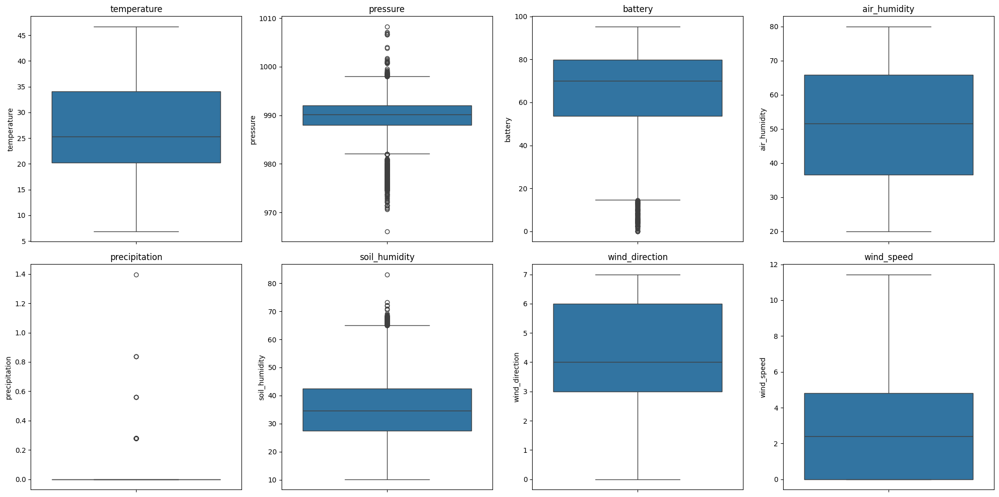

 
Información correspondiente al sensor 380033001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


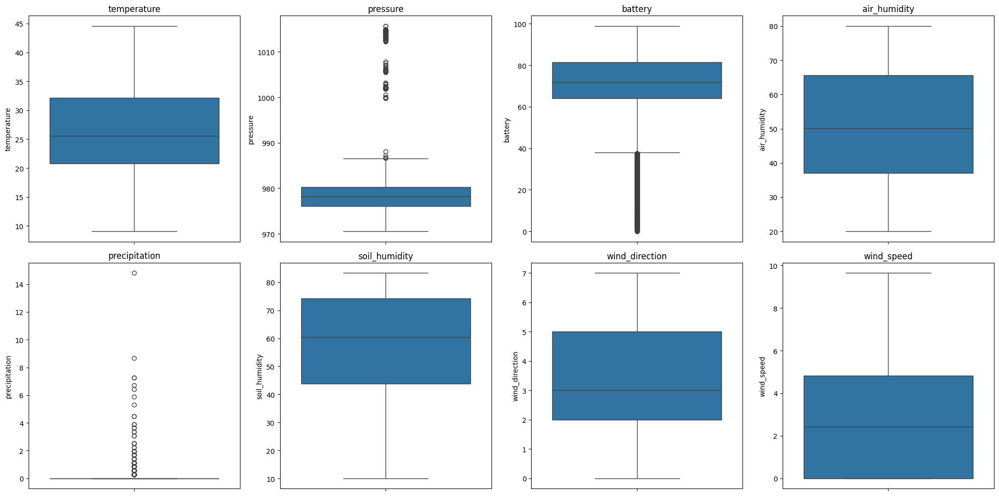

 
Información correspondiente al sensor 46005a000351353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


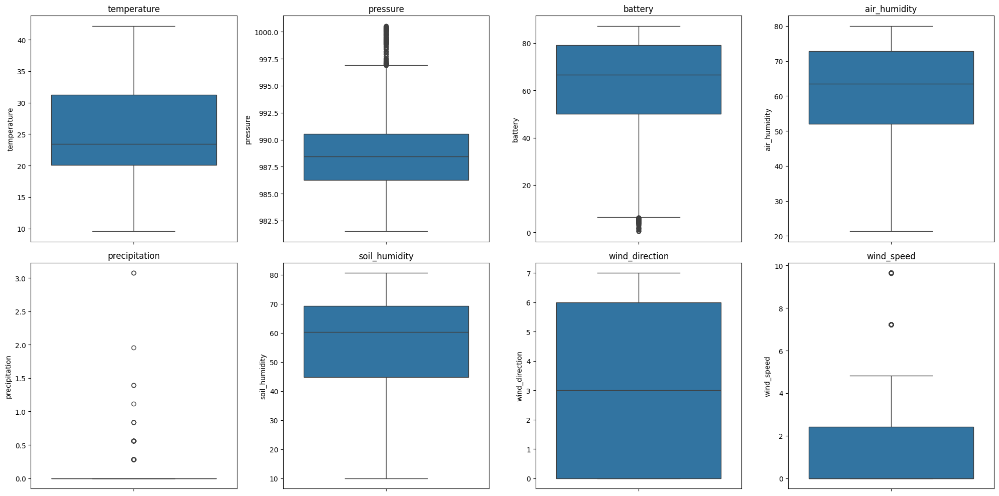

 
Información correspondiente al sensor 4e0022000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


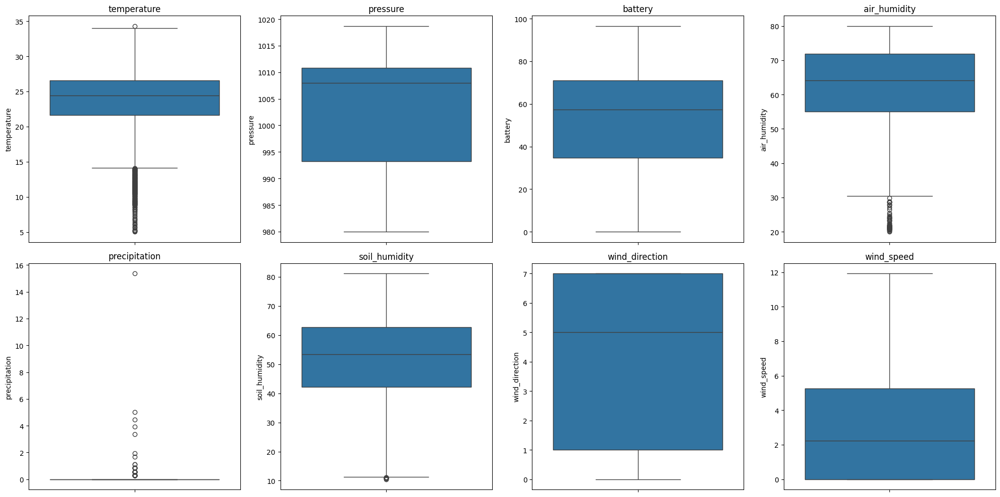

 
Información correspondiente al sensor 4e0031000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


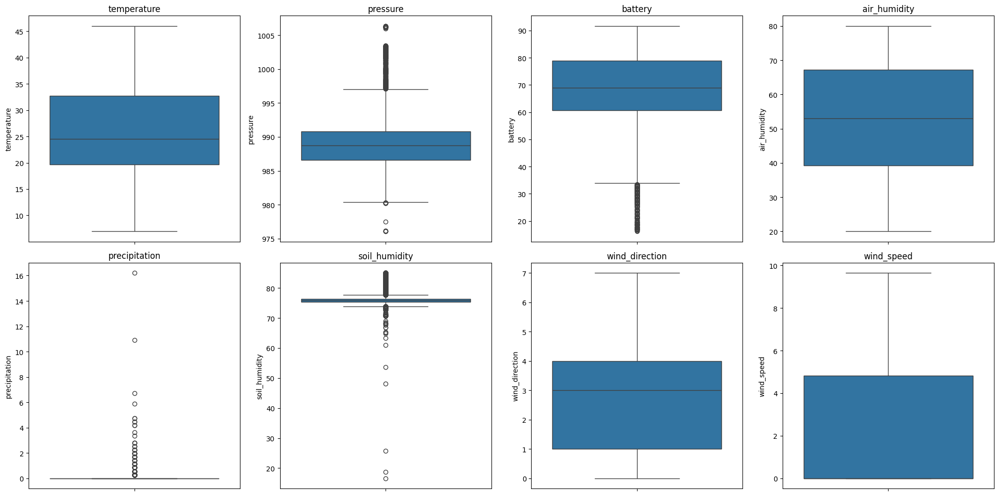

 
Información correspondiente al sensor 46004e000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


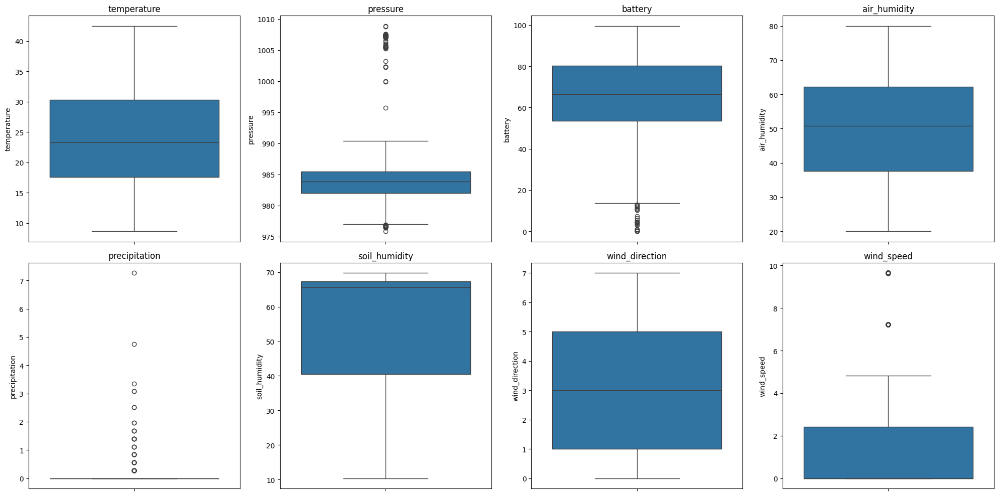

 
Información correspondiente al sensor 200034001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


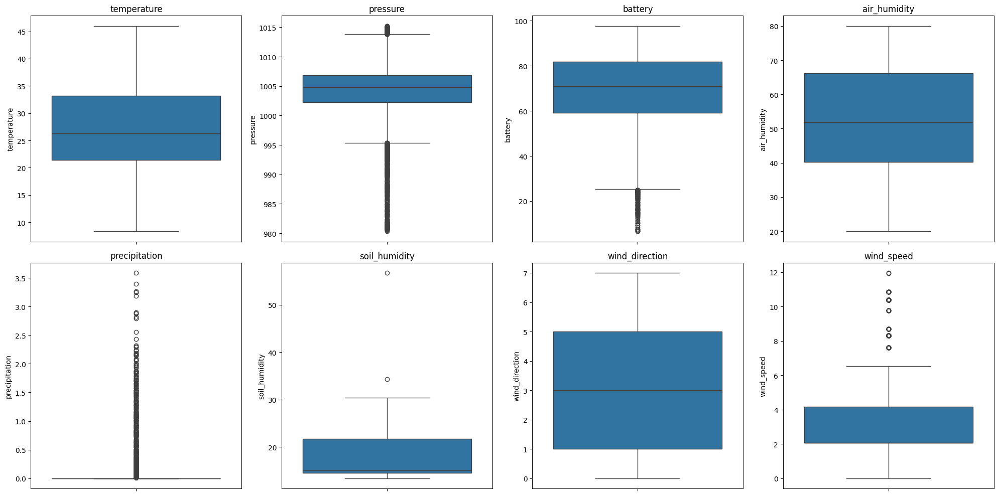

In [33]:
for sensor_id, dataset in sensors_data_clean.items():
    print(" ")
    print(f"Información correspondiente al sensor {sensor_id}:")
    print("-------------------------------------------------------------------------------------------------------------------------------------")
    print_boxplots(dataset, sensor_id)

### Punto 3

sensor1_raw_data.index: Se refiere al índice del DataFrame sensor1_raw_data, que, en este caso, parece ser un índice de tipo datetime (fecha y hora).

floor('T'): Es un método de Pandas que redondea las fechas del índice hacia abajo a la unidad más cercana que se especifica. En este caso:

'T' significa minuto (abreviatura de "minute").
Específicamente, floor('T') redondea la fecha/hora hacia abajo, eliminando cualquier información de los segundos y fracciones de segundos, dejando solo la hora y los minutos.

Después de aplicar floor('T'):

2018-04-05 20:55:42.958 y 2018-04-05 20:55:43.617 se redondearán a 2018-04-05 20:55:00.
2018-04-05 20:56:55.833 se redondeará a 2018-04-05 20:56:00.
Resultado:
Este proceso elimina la parte de los segundos y milisegundos del índice, lo que puede ser útil si deseas agrupar o analizar datos a nivel de minutos, sin preocuparte por las diferencias menores que ocurren dentro del mismo minuto.

Por ejemplo, en un análisis de datos de sensores, podría no ser relevante distinguir entre mediciones tomadas a las 20:55:42.958 y las 20:55:43.617, por lo que se redondean a la misma marca de tiempo de minuto exacto.

### Agrupa el DataFrame redondeado por el índice de tiempo. Para cada grupo (es decir, cada minuto), selecciona la primera fila disponible en caso de que existan varias filas con el mismo minuto. sto es útil para eliminar datos duplicados o consolidar varias mediciones en un solo valor por minuto.

In [34]:
for sensor_id, df in sensors_data_clean.items():
    sensors_data_clean[sensor_id].index = sensors_data_clean[sensor_id].index.floor(intervalo)
    sensors_data_clean[sensor_id] = sensors_data_clean[sensor_id].groupby(df.index).first()
    sensors_data_clean[sensor_id] = sensors_data_clean[sensor_id].dropna(how='all')

In [35]:
for sensor_id, df in sensors_data_clean.items():
    display(df.describe())

variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,4565.000000,4556.000000,4530.000000,4135.000000,4566.000000,4541.000000,4547.000000,4544.000000
mean,26.781496,990.001403,65.873281,51.491510,0.001040,36.100406,4.071036,2.970602
std,8.763238,3.430449,16.420895,16.992069,0.025132,12.083262,1.987425,3.197300
min,7.150867,966.104980,0.269531,20.000977,0.000000,10.168457,0.000000,0.000000
25%,20.149685,988.053742,53.464844,36.758942,0.000000,27.454834,3.000000,0.000000
50%,25.222656,990.256256,69.789063,52.013916,0.000000,34.552002,4.000000,2.412060
75%,33.963612,992.058121,79.933594,66.494507,0.000000,42.666016,6.000000,4.824121
max,46.683578,1007.080017,95.285156,79.990906,1.397000,83.153076,7.000000,11.200000


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,4266.000000,4251.000000,4253.000000,3876.000000,4270.000000,4166.000000,4171.000000,4180.000000
mean,26.344271,978.299614,68.856028,52.692308,0.011778,57.543452,3.434428,4.010785
std,7.220989,4.109298,16.006299,16.392695,0.184743,17.428683,2.236433,3.165523
min,9.059934,970.607483,0.039063,20.008606,0.000000,10.189209,0.000000,0.000000
25%,20.656446,975.997498,63.687500,38.963836,0.000000,45.924072,2.000000,2.412060
50%,24.943804,978.057495,70.937500,51.880402,0.000000,62.556763,3.000000,2.412060
75%,32.566666,979.912476,81.074219,67.383331,0.000000,74.188232,5.000000,7.236181
max,44.302605,1015.682495,98.925781,79.998535,8.661399,81.887207,7.000000,9.648241


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,1300.000000,1300.000000,1300.000000,802.000000,1300.000000,1174.000000,1299.000000,1299.000000
mean,25.451786,988.726354,60.885367,62.293412,0.007737,53.417878,3.173980,1.945959
std,7.034899,3.581000,21.827074,13.323356,0.080936,17.959874,2.606245,2.548033
min,10.035918,981.552490,0.535156,21.580261,0.000000,10.043945,0.000000,0.000000
25%,20.071929,986.297485,50.011719,52.683395,0.000000,43.236694,0.000000,0.000000
50%,23.533454,988.432495,66.578125,64.205689,0.000000,59.599609,3.000000,0.000000
75%,31.416400,990.527512,79.281250,73.708099,0.000000,69.161072,6.000000,2.412060
max,41.310303,1000.532471,87.207031,79.983276,1.955800,80.579834,7.000000,9.648241


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,627.000000,624.000000,637.000000,430.000000,638.000000,635.000000,546.000000,631.000000
mean,23.120161,1002.693818,53.328941,62.041832,0.021021,49.773380,3.979853,3.429445
std,5.766458,10.522097,23.105608,14.028528,0.173767,14.841629,2.702625,3.282936
min,5.027297,980.112488,0.023438,20.000977,0.000000,10.479736,0.000000,0.000000
25%,21.602936,993.117493,34.269531,54.895920,0.000000,40.632324,1.000000,0.000000
50%,24.407549,1008.020019,58.210938,64.652008,0.000000,52.979736,4.000000,2.960000
75%,26.531118,1010.827515,71.757813,73.067230,0.000000,62.753906,7.000000,5.255474
max,33.985062,1018.702515,95.445313,79.968018,3.352800,80.704346,7.000000,11.920000


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,4869.000000,4862.000000,4859.000000,4275.000000,4870.000000,4858.000000,4860.000000,4860.000000
mean,25.961192,988.905282,68.068358,53.219119,0.011015,76.166883,2.794239,2.520730
std,8.120214,3.437376,12.994005,16.391835,0.208538,2.182898,1.799376,3.056644
min,7.268843,976.117493,16.207031,20.092529,0.000000,18.739014,0.000000,0.000000
25%,19.677780,986.620621,60.742188,39.433044,0.000000,75.288086,1.000000,0.000000
50%,24.568426,988.751251,68.968750,53.318542,0.000000,75.786133,3.000000,2.412060
75%,32.816025,990.741867,78.953125,67.753357,0.000000,76.263428,4.000000,4.824121
max,45.911369,1006.349976,91.488281,79.990906,10.896598,84.979248,7.000000,9.648241


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,1267.000000,1262.000000,1280.000000,1146.000000,1281.000000,539.000000,1229.000000,1281.000000
mean,23.887090,984.024513,64.906314,50.701121,0.016358,54.534593,3.341741,1.971385
std,7.610780,3.445610,17.335045,15.975220,0.233058,17.268390,2.124862,2.737867
min,8.888332,976.682495,0.023438,20.000977,0.000000,10.355225,0.000000,0.000000
25%,17.597113,982.082520,53.082031,37.413162,0.000000,40.435181,1.000000,0.000000
50%,23.152712,983.859985,66.433594,50.861878,0.000000,65.617676,4.000000,0.000000
75%,30.306353,985.456894,80.257813,62.771362,0.000000,67.412720,5.000000,2.412060
max,42.490063,1008.877502,97.027344,79.823059,7.264399,69.747314,7.000000,9.648241


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
count,5312.000000,5296.000000,5278.000000,4501.000000,5311.000000,5290.000000,3586.000000,5285.000000
mean,27.155898,1004.524397,67.864407,53.468813,0.018020,17.932437,3.109035,3.193957
std,7.863009,4.191220,14.448537,15.896232,0.153276,4.978166,2.345497,2.617830
min,8.480779,980.594971,6.613281,20.000977,0.000000,13.551025,0.000000,0.000000
25%,21.779900,1002.416854,57.894531,40.707153,0.000000,14.443359,1.000000,2.077994
50%,26.370241,1004.873749,70.281250,52.570862,0.000000,15.003662,3.000000,2.077994
75%,33.269161,1006.968140,81.726563,67.326111,0.000000,21.416016,5.000000,4.155989
max,45.771942,1015.222473,95.917969,79.998535,3.190000,34.344482,7.000000,10.866714


In [36]:
for sensor_id, df in sensors_data_clean.items():
    display(df.head())

variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-05 20:15:00,25.941238,NaN,91.488281,38.952393,0.0,26.770020,NaN,0.0
2018-04-05 21:00:00,20.578690,986.719971,91.488281,39.272827,0.0,27.517090,NaN,0.0
2018-04-05 21:45:00,21.758450,986.772522,90.699219,37.548584,0.0,29.301758,NaN,0.0
2018-04-05 22:30:00,20.449987,986.777527,90.539063,39.852661,0.0,29.384766,NaN,0.0
2018-04-05 23:15:00,20.010260,986.929993,94.179688,40.821594,0.0,26.770020,NaN,0.0


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-13 20:15:00,21.286545,977.619995,91.488281,40.318054,0.0,26.977539,NaN,0.0
2018-04-13 21:00:00,19.699230,978.292480,81.890625,45.666260,0.0,26.251221,NaN,0.0
2018-04-13 21:45:00,19.484730,979.362488,75.855469,50.121826,0.0,25.441895,NaN,0.0
2018-04-13 22:30:00,19.184425,980.094971,74.710938,50.564331,0.0,25.524902,NaN,0.0
2018-04-13 23:15:00,19.259502,980.885010,73.562500,50.159973,0.0,25.690918,NaN,0.0


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-08-23 12:45:00,31.378862,984.222473,86.203125,54.516357,0.0000,80.579834,0.0,0.00000
2018-08-23 13:30:00,29.512695,984.377502,82.703125,58.575195,0.0000,64.683838,3.0,0.00000
2018-08-23 14:15:00,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2018-08-23 15:00:00,28.654688,983.794983,83.031250,69.553894,0.0000,66.800537,0.0,2.41206
2018-08-23 15:45:00,29.941700,986.539978,82.378906,58.743042,1.9558,68.439941,7.0,0.00000


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-27 09:45:00,27.968281,1002.565002,93.703125,39.478821,0.0,27.185059,NaN,0.0
2018-04-27 17:15:00,NaN,NaN,86.632813,NaN,0.0,21.229248,NaN,0.0
2018-04-27 18:00:00,28.054083,1001.299988,92.753906,63.450378,0.0,NaN,NaN,0.0
2018-04-30 12:45:00,NaN,NaN,90.539063,NaN,0.0,24.259033,NaN,0.0
2018-04-30 13:30:00,NaN,NaN,87.492188,NaN,0.0,26.105957,NaN,0.0


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-05-08 19:30:00,NaN,NaN,87.925781,NaN,0.0,18.739014,NaN,0.0
2018-05-10 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN
2018-05-10 12:45:00,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN
2018-05-10 13:30:00,NaN,NaN,87.492188,NaN,0.0,25.711670,3.0,0.0
2018-05-10 14:15:00,28.686863,1006.349976,91.488281,56.927246,0.0,67.734375,1.0,0.0


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-04-25 21:00:00,NaN,NaN,81.726563,NaN,0.0,27.060547,NaN,0.0
2018-05-02 09:45:00,NaN,NaN,87.207031,NaN,0.0,22.993164,NaN,0.0
2018-05-02 10:30:00,NaN,NaN,86.917969,NaN,0.0,23.823242,NaN,0.0
2018-05-02 11:15:00,NaN,NaN,86.777344,NaN,0.0,23.781738,NaN,0.0
2018-05-02 12:00:00,NaN,NaN,88.210938,NaN,0.0,24.321289,NaN,0.0


variable,temperature,pressure,battery,air_humidity,precipitation,soil_humidity,wind_direction,wind_speed
fecha,,,,,,,,
2018-03-31 21:45:00,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2018-03-31 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN
2018-03-31 23:15:00,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN
2018-04-01 00:00:00,14.325957,1006.227478,78.789063,23.777527,0.0,20.544434,NaN,4.155989
2018-04-01 00:45:00,14.240156,1006.747498,76.671875,24.372620,0.0,19.735107,NaN,4.155989


In [37]:
for sensor_id, df in sensors_data_clean.items():
    display(df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4575 entries, 2018-04-05 20:15:00 to 2018-10-31 23:15:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     4565 non-null   float64
 1   pressure        4556 non-null   float64
 2   battery         4530 non-null   float64
 3   air_humidity    4135 non-null   float64
 4   precipitation   4566 non-null   float64
 5   soil_humidity   4541 non-null   float64
 6   wind_direction  4547 non-null   float64
 7   wind_speed      4544 non-null   float64
dtypes: float64(8)
memory usage: 321.7 KB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4276 entries, 2018-04-13 20:15:00 to 2018-09-19 02:15:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     4266 non-null   float64
 1   pressure        4251 non-null   float64
 2   battery         4253 non-null   float64
 3   air_humidity    3876 non-null   float64
 4   precipitation   4270 non-null   float64
 5   soil_humidity   4166 non-null   float64
 6   wind_direction  4171 non-null   float64
 7   wind_speed      4180 non-null   float64
dtypes: float64(8)
memory usage: 300.7 KB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1301 entries, 2018-08-23 12:45:00 to 2018-10-03 03:45:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     1300 non-null   float64
 1   pressure        1300 non-null   float64
 2   battery         1300 non-null   float64
 3   air_humidity    802 non-null    float64
 4   precipitation   1300 non-null   float64
 5   soil_humidity   1174 non-null   float64
 6   wind_direction  1299 non-null   float64
 7   wind_speed      1299 non-null   float64
dtypes: float64(8)
memory usage: 91.5 KB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 647 entries, 2018-04-27 09:45:00 to 2018-10-31 23:15:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     627 non-null    float64
 1   pressure        624 non-null    float64
 2   battery         637 non-null    float64
 3   air_humidity    430 non-null    float64
 4   precipitation   638 non-null    float64
 5   soil_humidity   635 non-null    float64
 6   wind_direction  546 non-null    float64
 7   wind_speed      631 non-null    float64
dtypes: float64(8)
memory usage: 45.5 KB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4883 entries, 2018-05-08 19:30:00 to 2018-10-17 01:30:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     4869 non-null   float64
 1   pressure        4862 non-null   float64
 2   battery         4859 non-null   float64
 3   air_humidity    4275 non-null   float64
 4   precipitation   4870 non-null   float64
 5   soil_humidity   4858 non-null   float64
 6   wind_direction  4860 non-null   float64
 7   wind_speed      4860 non-null   float64
dtypes: float64(8)
memory usage: 343.3 KB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1308 entries, 2018-04-25 21:00:00 to 2018-06-28 20:15:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     1267 non-null   float64
 1   pressure        1262 non-null   float64
 2   battery         1280 non-null   float64
 3   air_humidity    1146 non-null   float64
 4   precipitation   1281 non-null   float64
 5   soil_humidity   539 non-null    float64
 6   wind_direction  1229 non-null   float64
 7   wind_speed      1281 non-null   float64
dtypes: float64(8)
memory usage: 92.0 KB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5317 entries, 2018-03-31 21:45:00 to 2018-09-14 17:15:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     5312 non-null   float64
 1   pressure        5296 non-null   float64
 2   battery         5278 non-null   float64
 3   air_humidity    4501 non-null   float64
 4   precipitation   5311 non-null   float64
 5   soil_humidity   5290 non-null   float64
 6   wind_direction  3586 non-null   float64
 7   wind_speed      5285 non-null   float64
dtypes: float64(8)
memory usage: 373.9 KB


None

In [38]:
for sensor_id, df in sensors_data_clean.items():
    print(f"Valores NaN en sensor {sensor_id}")
    display(df.isna().sum())
    print(" ")

Valores NaN en sensor 270043001951343334363036


variable
temperature        10
pressure           19
battery            45
air_humidity      440
precipitation       9
soil_humidity      34
wind_direction     28
wind_speed         31
dtype: int64

 
Valores NaN en sensor 380033001951343334363036


variable
temperature        10
pressure           25
battery            23
air_humidity      400
precipitation       6
soil_humidity     110
wind_direction    105
wind_speed         96
dtype: int64

 
Valores NaN en sensor 46005a000351353337353037


variable
temperature         1
pressure            1
battery             1
air_humidity      499
precipitation       1
soil_humidity     127
wind_direction      2
wind_speed          2
dtype: int64

 
Valores NaN en sensor 4e0022000251353337353037


variable
temperature        20
pressure           23
battery            10
air_humidity      217
precipitation       9
soil_humidity      12
wind_direction    101
wind_speed         16
dtype: int64

 
Valores NaN en sensor 4e0031000251353337353037


variable
temperature        14
pressure           21
battery            24
air_humidity      608
precipitation      13
soil_humidity      25
wind_direction     23
wind_speed         23
dtype: int64

 
Valores NaN en sensor 46004e000251353337353037


variable
temperature        41
pressure           46
battery            28
air_humidity      162
precipitation      27
soil_humidity     769
wind_direction     79
wind_speed         27
dtype: int64

 
Valores NaN en sensor 200034001951343334363036


variable
temperature          5
pressure            21
battery             39
air_humidity       816
precipitation        6
soil_humidity       27
wind_direction    1731
wind_speed          32
dtype: int64

### Punto 3.1 Correlacíón e regresión lineal multiple

In [39]:
def correlacion(df, filename):
    # Calcular la matriz de correlación metodo spearman
    corr = df.corr(method='spearman', numeric_only=True)

    # Crear una máscara para el triángulo superior de la matriz de correlación
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)

    # Crear una paleta de colores divergente para resaltar las correlaciones positivas y negativas
    cmap = sns.diverging_palette(145, 300, as_cmap=True)

    # Specify size of heatmap
    fig, ax = plt.subplots(figsize=(15, 8))

    # Dibujar el mapa de calor
    sns.heatmap(corr, mask=mask, cmap="coolwarm", vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, annot_kws={"fontsize":12})#
    #sns.heatmap(corr, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, annot_kws={"fontsize":12})
    
    # Save the plot
    plt.tight_layout()
    plt.savefig(f"corr_{filename}.png")  # Uncomment to save the plot as an image
    #plt.close()

    # Mostrar el gráfico
    plt.show()
    plt.close()

 
Información correspondiente al sensor 270043001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


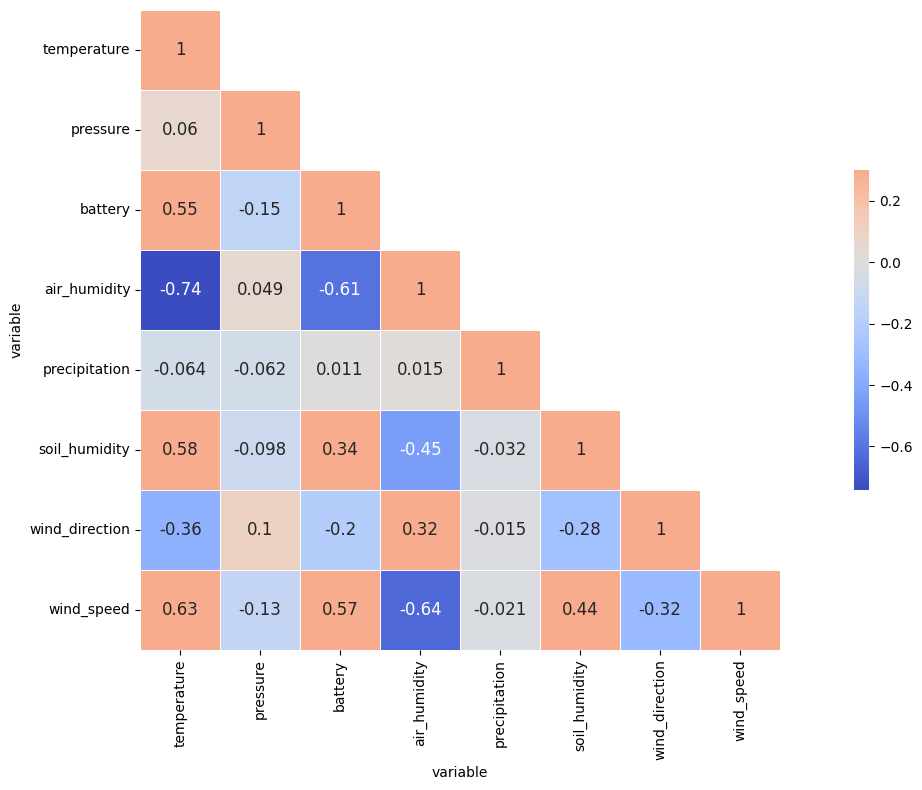

 
Información correspondiente al sensor 380033001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


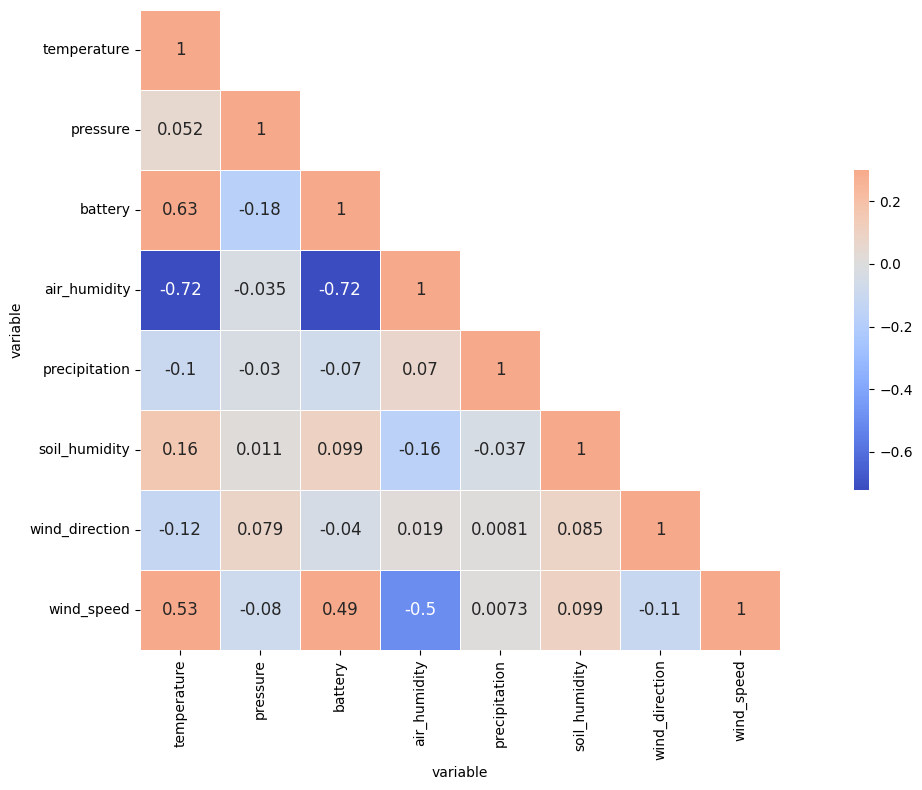

 
Información correspondiente al sensor 46005a000351353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


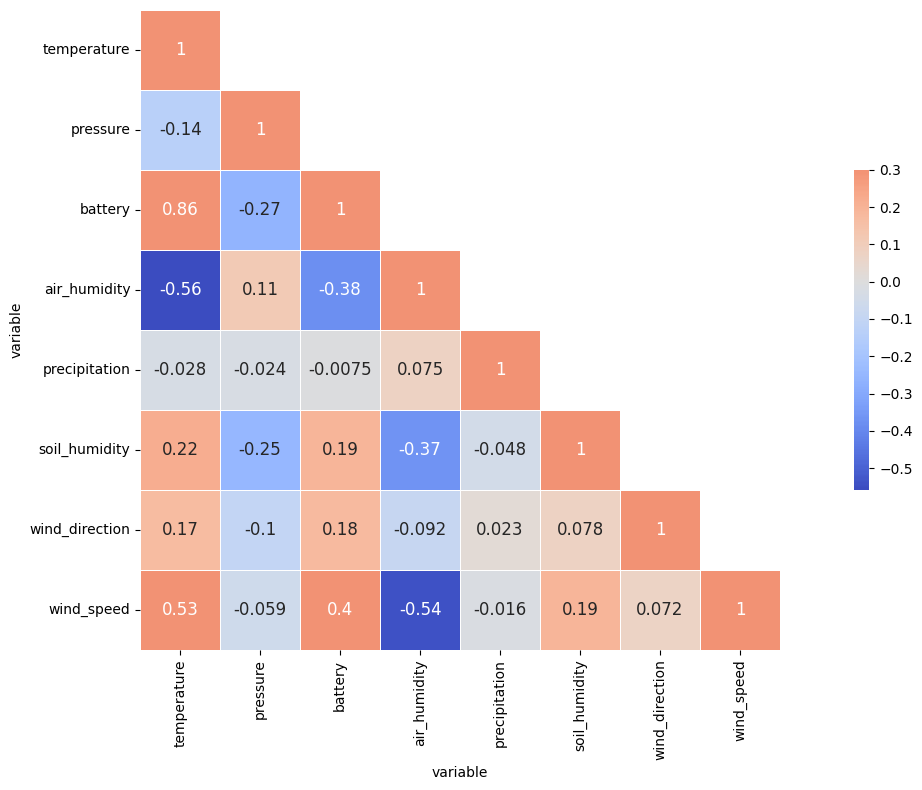

 
Información correspondiente al sensor 4e0022000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


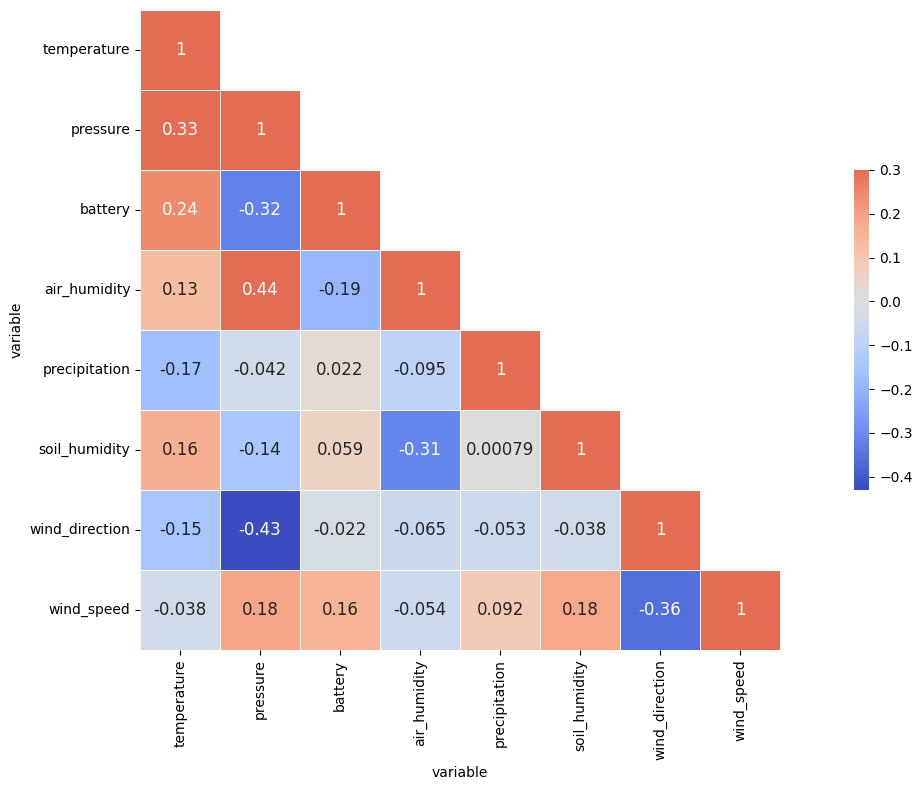

 
Información correspondiente al sensor 4e0031000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


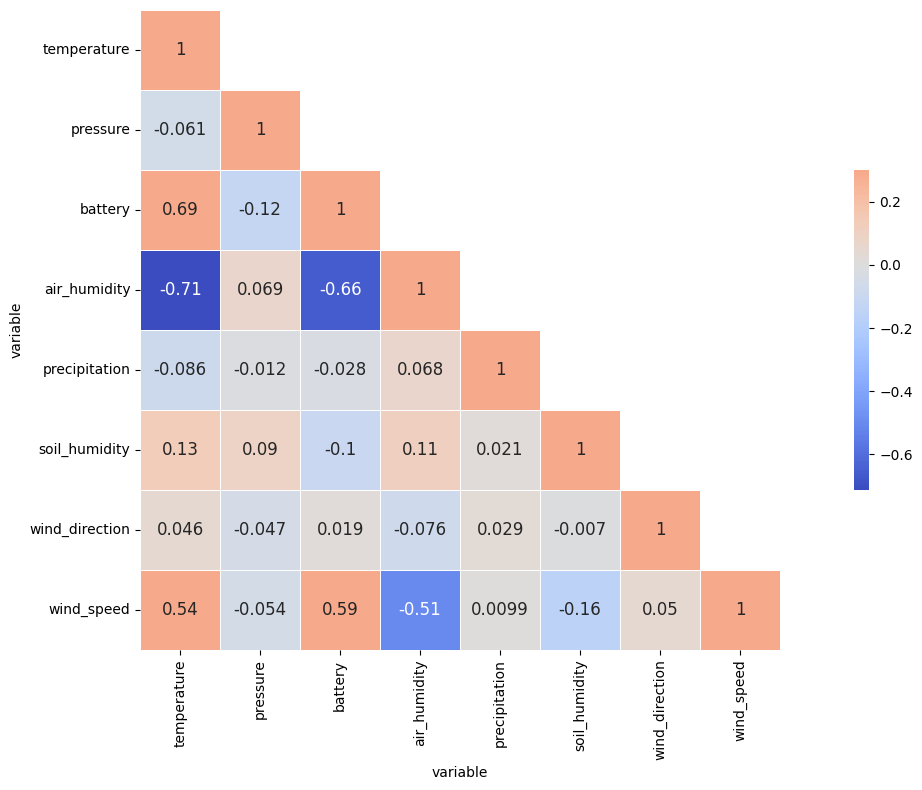

 
Información correspondiente al sensor 46004e000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


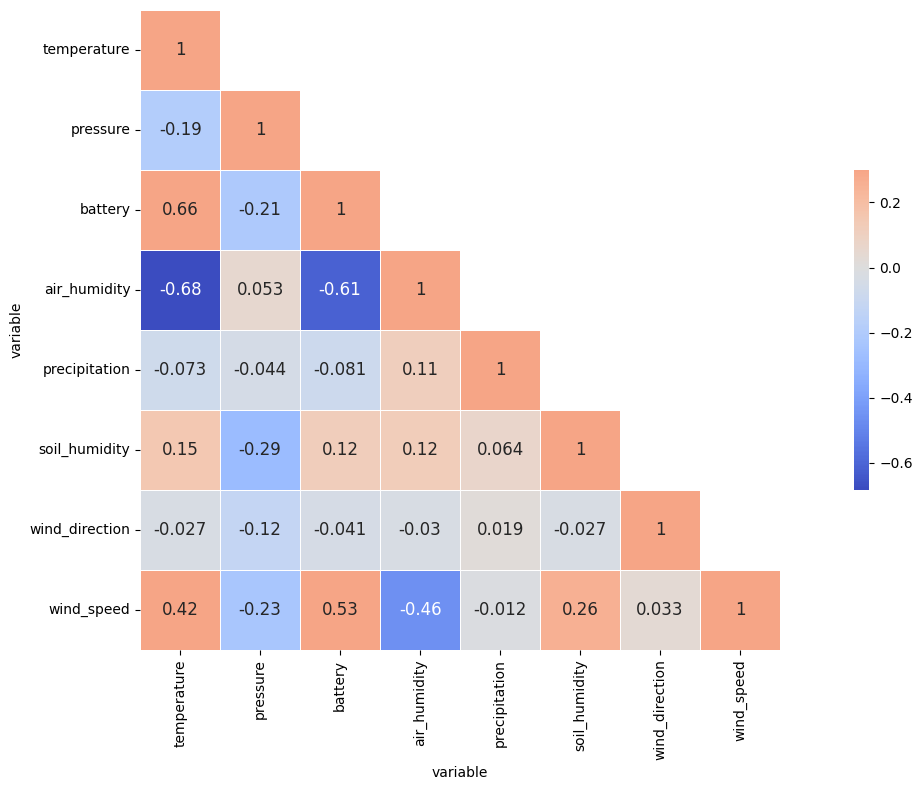

 
Información correspondiente al sensor 200034001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


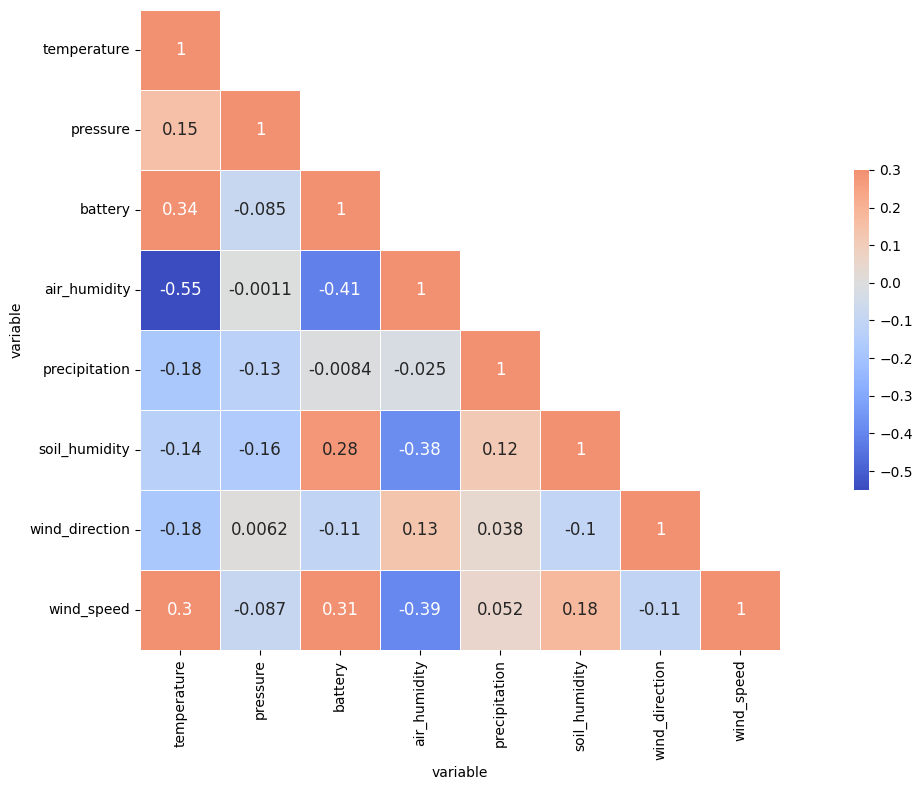

In [40]:
# Hay que apretar el conjunto de datos
for sensor_id, dataset in sensors_data_clean.items():
    print(" ")
    print(f"Información correspondiente al sensor {sensor_id}:")
    print("-------------------------------------------------------------------------------------------------------------------------------------")
    correlacion(dataset, sensor_id)

In [41]:
for sensor_id, df in sensors_data_clean.items():
    sensors_data_clean[sensor_id] = df.drop(["precipitation", "wind_direction"], axis=1)
    sensors_data_clean[sensor_id] = sensors_data_clean[sensor_id].dropna(how='all')

In [42]:
for sensor_id, df in sensors_data_clean.items():
    print(f"Valores NaN en sensor {sensor_id}")
    display(df.isna().sum())
    print(" ")

Valores NaN en sensor 270043001951343334363036


variable
temperature        1
pressure          10
battery           36
air_humidity     431
soil_humidity     25
wind_speed        22
dtype: int64

 
Valores NaN en sensor 380033001951343334363036


variable
temperature        6
pressure          21
battery           19
air_humidity     396
soil_humidity    106
wind_speed        92
dtype: int64

 
Valores NaN en sensor 46005a000351353337353037


variable
temperature        0
pressure           0
battery            0
air_humidity     498
soil_humidity    126
wind_speed         1
dtype: int64

 
Valores NaN en sensor 4e0022000251353337353037


variable
temperature       11
pressure          14
battery            1
air_humidity     208
soil_humidity      3
wind_speed         7
dtype: int64

 
Valores NaN en sensor 4e0031000251353337353037


variable
temperature        2
pressure           9
battery           12
air_humidity     596
soil_humidity     13
wind_speed        11
dtype: int64

 
Valores NaN en sensor 46004e000251353337353037


variable
temperature       15
pressure          20
battery            2
air_humidity     136
soil_humidity    743
wind_speed         1
dtype: int64

 
Valores NaN en sensor 200034001951343334363036


variable
temperature        0
pressure          16
battery           34
air_humidity     811
soil_humidity     22
wind_speed        27
dtype: int64

In [43]:
for sensor_id, df in sensors_data_clean.items():
    display(df.info())
    display(df.describe())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4566 entries, 2018-04-05 20:15:00 to 2018-10-31 23:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    4565 non-null   float64
 1   pressure       4556 non-null   float64
 2   battery        4530 non-null   float64
 3   air_humidity   4135 non-null   float64
 4   soil_humidity  4541 non-null   float64
 5   wind_speed     4544 non-null   float64
dtypes: float64(6)
memory usage: 249.7 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,4565.000000,4556.000000,4530.000000,4135.000000,4541.000000,4544.000000
mean,26.781496,990.001403,65.873281,51.491510,36.100406,2.970602
std,8.763238,3.430449,16.420895,16.992069,12.083262,3.197300
min,7.150867,966.104980,0.269531,20.000977,10.168457,0.000000
25%,20.149685,988.053742,53.464844,36.758942,27.454834,0.000000
50%,25.222656,990.256256,69.789063,52.013916,34.552002,2.412060
75%,33.963612,992.058121,79.933594,66.494507,42.666016,4.824121
max,46.683578,1007.080017,95.285156,79.990906,83.153076,11.200000


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4272 entries, 2018-04-13 20:15:00 to 2018-09-19 02:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    4266 non-null   float64
 1   pressure       4251 non-null   float64
 2   battery        4253 non-null   float64
 3   air_humidity   3876 non-null   float64
 4   soil_humidity  4166 non-null   float64
 5   wind_speed     4180 non-null   float64
dtypes: float64(6)
memory usage: 233.6 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,4266.000000,4251.000000,4253.000000,3876.000000,4166.000000,4180.000000
mean,26.344271,978.299614,68.856028,52.692308,57.543452,4.010785
std,7.220989,4.109298,16.006299,16.392695,17.428683,3.165523
min,9.059934,970.607483,0.039063,20.008606,10.189209,0.000000
25%,20.656446,975.997498,63.687500,38.963836,45.924072,2.412060
50%,24.943804,978.057495,70.937500,51.880402,62.556763,2.412060
75%,32.566666,979.912476,81.074219,67.383331,74.188232,7.236181
max,44.302605,1015.682495,98.925781,79.998535,81.887207,9.648241


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1300 entries, 2018-08-23 12:45:00 to 2018-10-03 03:45:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    1300 non-null   float64
 1   pressure       1300 non-null   float64
 2   battery        1300 non-null   float64
 3   air_humidity   802 non-null    float64
 4   soil_humidity  1174 non-null   float64
 5   wind_speed     1299 non-null   float64
dtypes: float64(6)
memory usage: 71.1 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,1300.000000,1300.000000,1300.000000,802.000000,1174.000000,1299.000000
mean,25.451786,988.726354,60.885367,62.293412,53.417878,1.945959
std,7.034899,3.581000,21.827074,13.323356,17.959874,2.548033
min,10.035918,981.552490,0.535156,21.580261,10.043945,0.000000
25%,20.071929,986.297485,50.011719,52.683395,43.236694,0.000000
50%,23.533454,988.432495,66.578125,64.205689,59.599609,0.000000
75%,31.416400,990.527512,79.281250,73.708099,69.161072,2.412060
max,41.310303,1000.532471,87.207031,79.983276,80.579834,9.648241


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 638 entries, 2018-04-27 09:45:00 to 2018-10-31 23:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    627 non-null    float64
 1   pressure       624 non-null    float64
 2   battery        637 non-null    float64
 3   air_humidity   430 non-null    float64
 4   soil_humidity  635 non-null    float64
 5   wind_speed     631 non-null    float64
dtypes: float64(6)
memory usage: 34.9 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,627.000000,624.000000,637.000000,430.000000,635.000000,631.000000
mean,23.120161,1002.693818,53.328941,62.041832,49.773380,3.429445
std,5.766458,10.522097,23.105608,14.028528,14.841629,3.282936
min,5.027297,980.112488,0.023438,20.000977,10.479736,0.000000
25%,21.602936,993.117493,34.269531,54.895920,40.632324,0.000000
50%,24.407549,1008.020019,58.210938,64.652008,52.979736,2.960000
75%,26.531118,1010.827515,71.757813,73.067230,62.753906,5.255474
max,33.985062,1018.702515,95.445313,79.968018,80.704346,11.920000


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4871 entries, 2018-05-08 19:30:00 to 2018-10-17 01:30:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    4869 non-null   float64
 1   pressure       4862 non-null   float64
 2   battery        4859 non-null   float64
 3   air_humidity   4275 non-null   float64
 4   soil_humidity  4858 non-null   float64
 5   wind_speed     4860 non-null   float64
dtypes: float64(6)
memory usage: 266.4 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,4869.000000,4862.000000,4859.000000,4275.000000,4858.000000,4860.000000
mean,25.961192,988.905282,68.068358,53.219119,76.166883,2.520730
std,8.120214,3.437376,12.994005,16.391835,2.182898,3.056644
min,7.268843,976.117493,16.207031,20.092529,18.739014,0.000000
25%,19.677780,986.620621,60.742188,39.433044,75.288086,0.000000
50%,24.568426,988.751251,68.968750,53.318542,75.786133,2.412060
75%,32.816025,990.741867,78.953125,67.753357,76.263428,4.824121
max,45.911369,1006.349976,91.488281,79.990906,84.979248,9.648241


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1282 entries, 2018-04-25 21:00:00 to 2018-06-28 20:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    1267 non-null   float64
 1   pressure       1262 non-null   float64
 2   battery        1280 non-null   float64
 3   air_humidity   1146 non-null   float64
 4   soil_humidity  539 non-null    float64
 5   wind_speed     1281 non-null   float64
dtypes: float64(6)
memory usage: 70.1 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,1267.000000,1262.000000,1280.000000,1146.000000,539.000000,1281.000000
mean,23.887090,984.024513,64.906314,50.701121,54.534593,1.971385
std,7.610780,3.445610,17.335045,15.975220,17.268390,2.737867
min,8.888332,976.682495,0.023438,20.000977,10.355225,0.000000
25%,17.597113,982.082520,53.082031,37.413162,40.435181,0.000000
50%,23.152712,983.859985,66.433594,50.861878,65.617676,0.000000
75%,30.306353,985.456894,80.257813,62.771362,67.412720,2.412060
max,42.490063,1008.877502,97.027344,79.823059,69.747314,9.648241


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5312 entries, 2018-04-01 00:00:00 to 2018-09-14 17:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    5312 non-null   float64
 1   pressure       5296 non-null   float64
 2   battery        5278 non-null   float64
 3   air_humidity   4501 non-null   float64
 4   soil_humidity  5290 non-null   float64
 5   wind_speed     5285 non-null   float64
dtypes: float64(6)
memory usage: 290.5 KB


None

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
count,5312.000000,5296.000000,5278.000000,4501.000000,5290.000000,5285.000000
mean,27.155898,1004.524397,67.864407,53.468813,17.932437,3.193957
std,7.863009,4.191220,14.448537,15.896232,4.978166,2.617830
min,8.480779,980.594971,6.613281,20.000977,13.551025,0.000000
25%,21.779900,1002.416854,57.894531,40.707153,14.443359,2.077994
50%,26.370241,1004.873749,70.281250,52.570862,15.003662,2.077994
75%,33.269161,1006.968140,81.726563,67.326111,21.416016,4.155989
max,45.771942,1015.222473,95.917969,79.998535,34.344482,10.866714


### Punto 4 Tamaño definitivo del dataframe

In [44]:
for sensor_id, df in sensors_data_clean.items():
    # Perform time-based interpolation on the dataframe
    sensors_data_clean[sensor_id] =  sensors_data_clean[sensor_id].interpolate(method="time", limit_direction="both")
    #sensors_data_clean[sensor_id] = sensors_data_clean[sensor_id].interpolate(method="time", 
    #limit_direction="both").fillna(method="bfill").fillna(method="ffill")
    sensors_data_clean[sensor_id] =  sensors_data_clean[sensor_id].round(2) 

In [45]:
for sensor_id, df in sensors_data_clean.items():
    print(f"Valores NaN en sensor {sensor_id}")
    display(df.isna().sum())
    print(" ")

Valores NaN en sensor 270043001951343334363036


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

 
Valores NaN en sensor 380033001951343334363036


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

 
Valores NaN en sensor 46005a000351353337353037


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

 
Valores NaN en sensor 4e0022000251353337353037


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

 
Valores NaN en sensor 4e0031000251353337353037


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

 
Valores NaN en sensor 46004e000251353337353037


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

 
Valores NaN en sensor 200034001951343334363036


variable
temperature      0
pressure         0
battery          0
air_humidity     0
soil_humidity    0
wind_speed       0
dtype: int64

In [46]:
for sensor_id, df in sensors_data_clean.items():
    #display(df.describe())
    print(f"Datos del sensor {sensor_id}")
    display(df.info())

Datos del sensor 270043001951343334363036
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4566 entries, 2018-04-05 20:15:00 to 2018-10-31 23:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    4566 non-null   float64
 1   pressure       4566 non-null   float64
 2   battery        4566 non-null   float64
 3   air_humidity   4566 non-null   float64
 4   soil_humidity  4566 non-null   float64
 5   wind_speed     4566 non-null   float64
dtypes: float64(6)
memory usage: 249.7 KB


None

Datos del sensor 380033001951343334363036
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4272 entries, 2018-04-13 20:15:00 to 2018-09-19 02:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    4272 non-null   float64
 1   pressure       4272 non-null   float64
 2   battery        4272 non-null   float64
 3   air_humidity   4272 non-null   float64
 4   soil_humidity  4272 non-null   float64
 5   wind_speed     4272 non-null   float64
dtypes: float64(6)
memory usage: 233.6 KB


None

Datos del sensor 46005a000351353337353037
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1300 entries, 2018-08-23 12:45:00 to 2018-10-03 03:45:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    1300 non-null   float64
 1   pressure       1300 non-null   float64
 2   battery        1300 non-null   float64
 3   air_humidity   1300 non-null   float64
 4   soil_humidity  1300 non-null   float64
 5   wind_speed     1300 non-null   float64
dtypes: float64(6)
memory usage: 71.1 KB


None

Datos del sensor 4e0022000251353337353037
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 638 entries, 2018-04-27 09:45:00 to 2018-10-31 23:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    638 non-null    float64
 1   pressure       638 non-null    float64
 2   battery        638 non-null    float64
 3   air_humidity   638 non-null    float64
 4   soil_humidity  638 non-null    float64
 5   wind_speed     638 non-null    float64
dtypes: float64(6)
memory usage: 34.9 KB


None

Datos del sensor 4e0031000251353337353037
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4871 entries, 2018-05-08 19:30:00 to 2018-10-17 01:30:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    4871 non-null   float64
 1   pressure       4871 non-null   float64
 2   battery        4871 non-null   float64
 3   air_humidity   4871 non-null   float64
 4   soil_humidity  4871 non-null   float64
 5   wind_speed     4871 non-null   float64
dtypes: float64(6)
memory usage: 266.4 KB


None

Datos del sensor 46004e000251353337353037
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1282 entries, 2018-04-25 21:00:00 to 2018-06-28 20:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    1282 non-null   float64
 1   pressure       1282 non-null   float64
 2   battery        1282 non-null   float64
 3   air_humidity   1282 non-null   float64
 4   soil_humidity  1282 non-null   float64
 5   wind_speed     1282 non-null   float64
dtypes: float64(6)
memory usage: 70.1 KB


None

Datos del sensor 200034001951343334363036
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5312 entries, 2018-04-01 00:00:00 to 2018-09-14 17:15:00
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   temperature    5312 non-null   float64
 1   pressure       5312 non-null   float64
 2   battery        5312 non-null   float64
 3   air_humidity   5312 non-null   float64
 4   soil_humidity  5312 non-null   float64
 5   wind_speed     5312 non-null   float64
dtypes: float64(6)
memory usage: 290.5 KB


None

 
Información correspondiente al sensor 270043001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


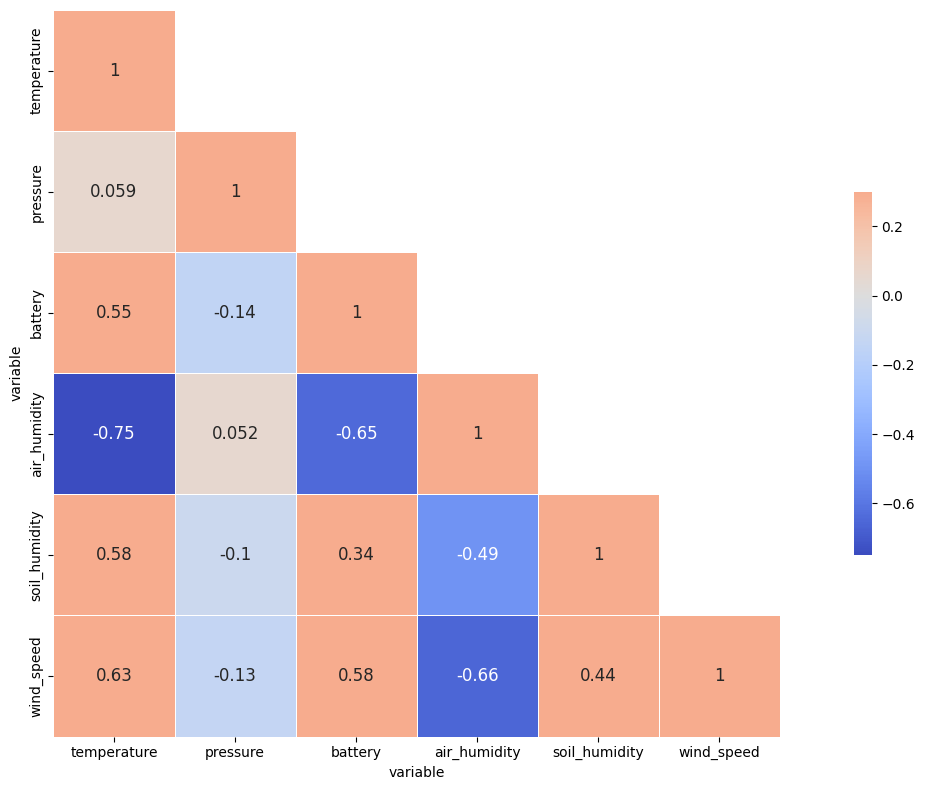

 
Información correspondiente al sensor 380033001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


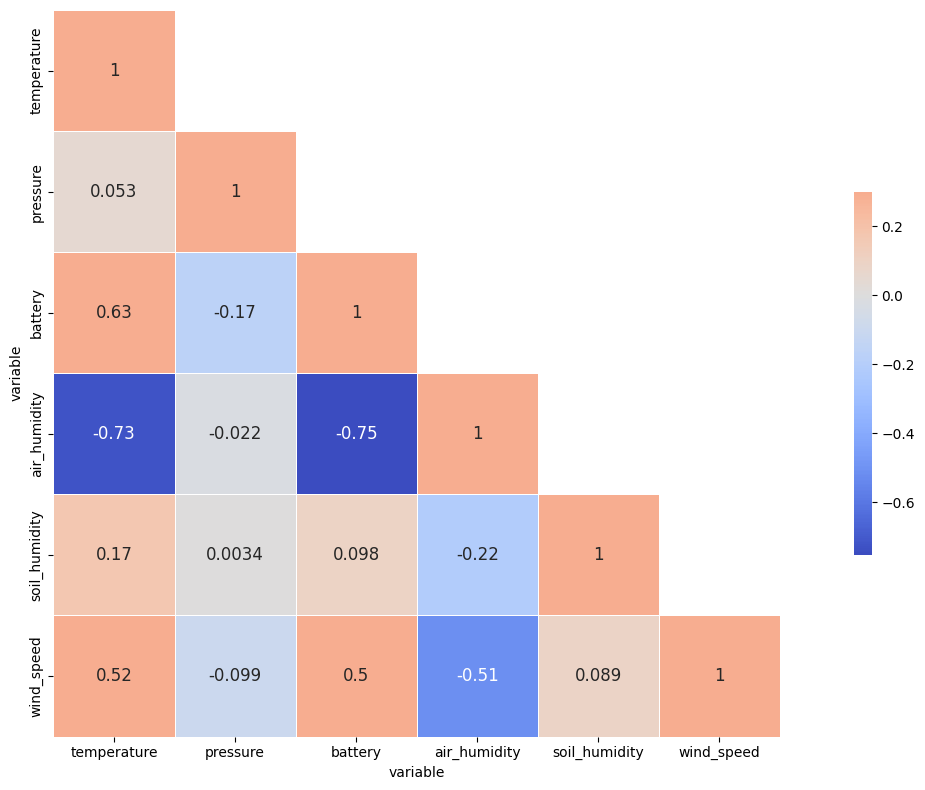

 
Información correspondiente al sensor 46005a000351353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


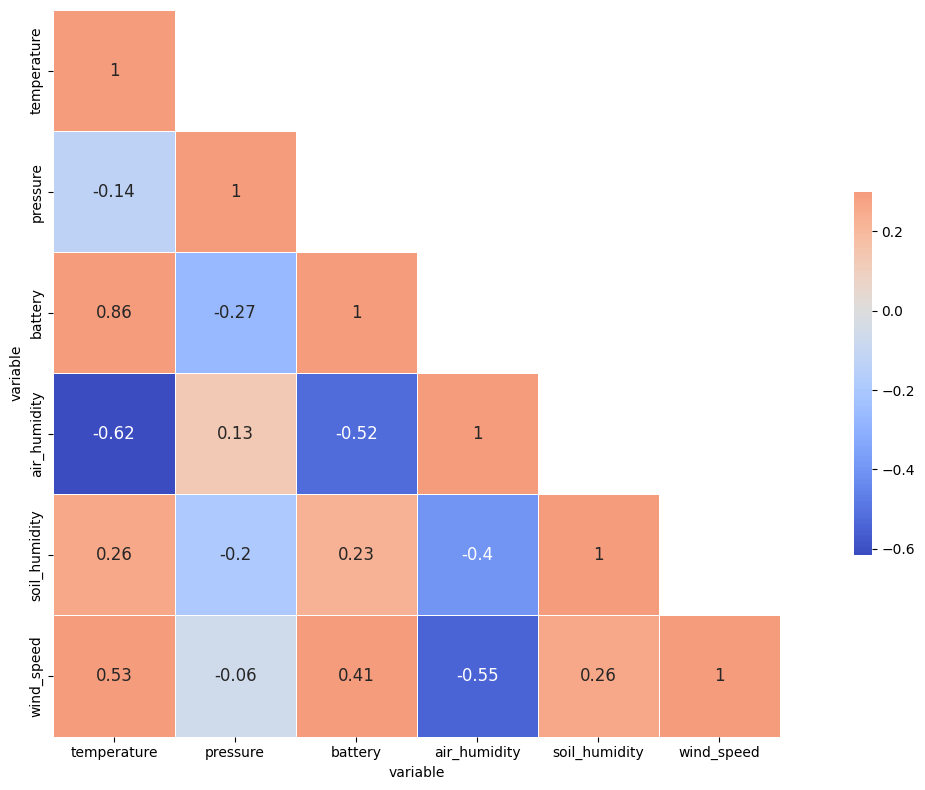

 
Información correspondiente al sensor 4e0022000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


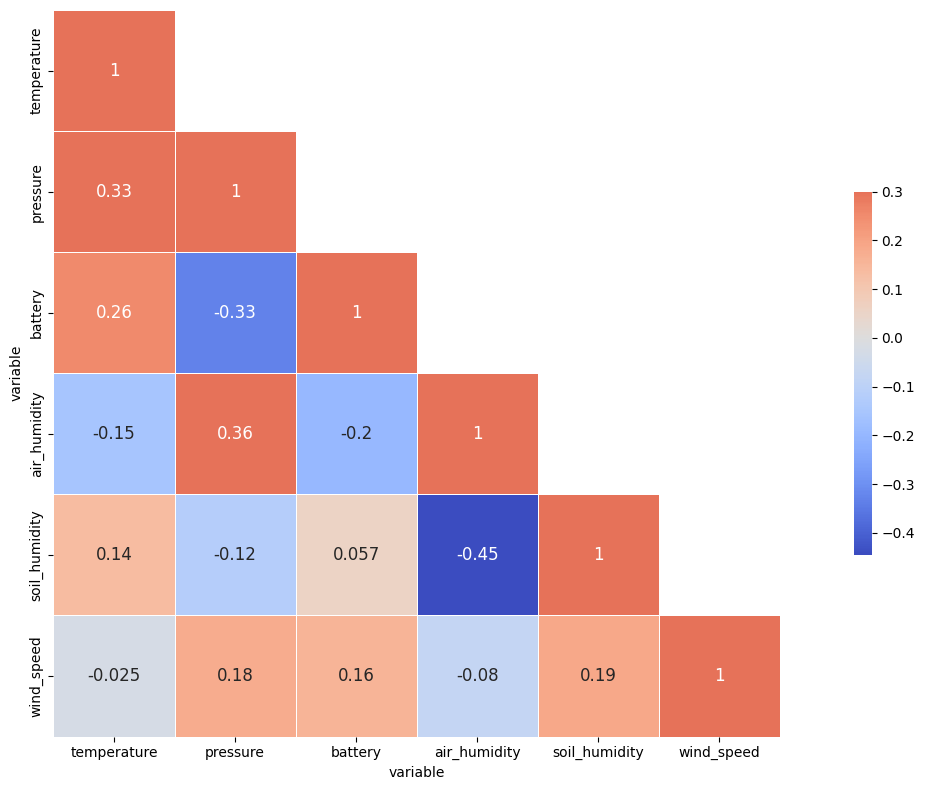

 
Información correspondiente al sensor 4e0031000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


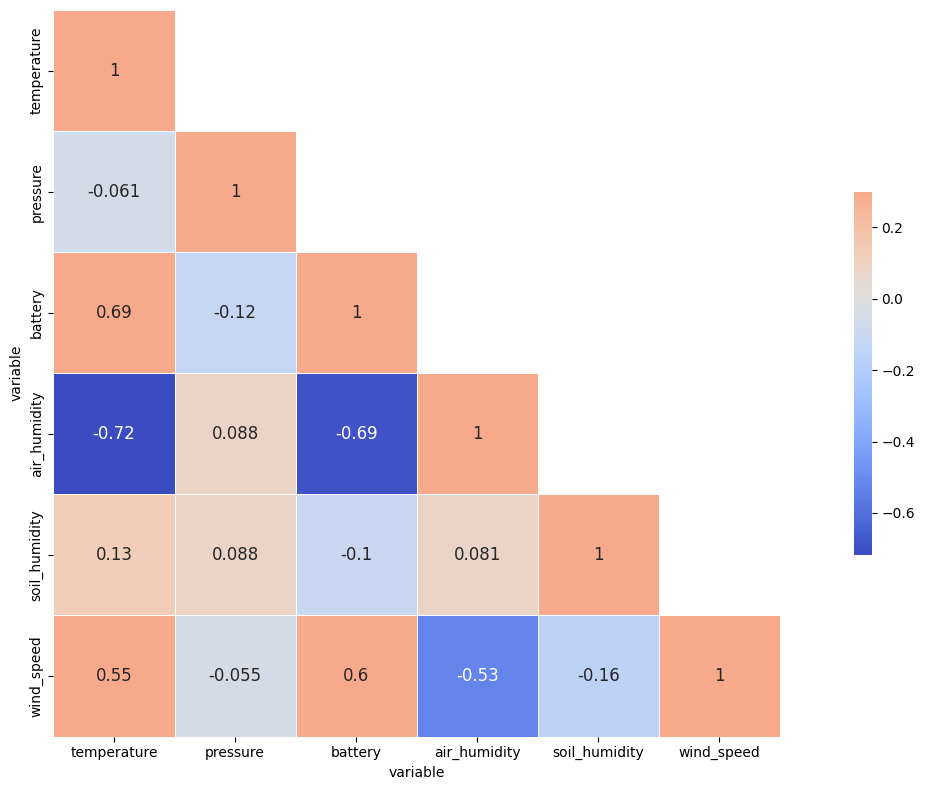

 
Información correspondiente al sensor 46004e000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


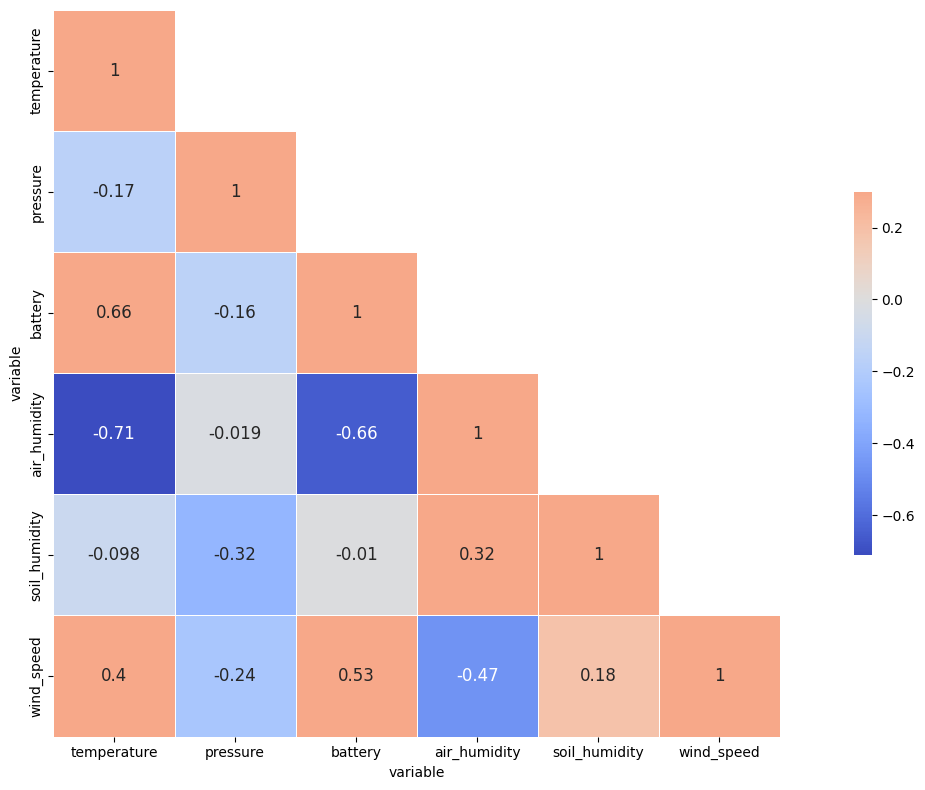

 
Información correspondiente al sensor 200034001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


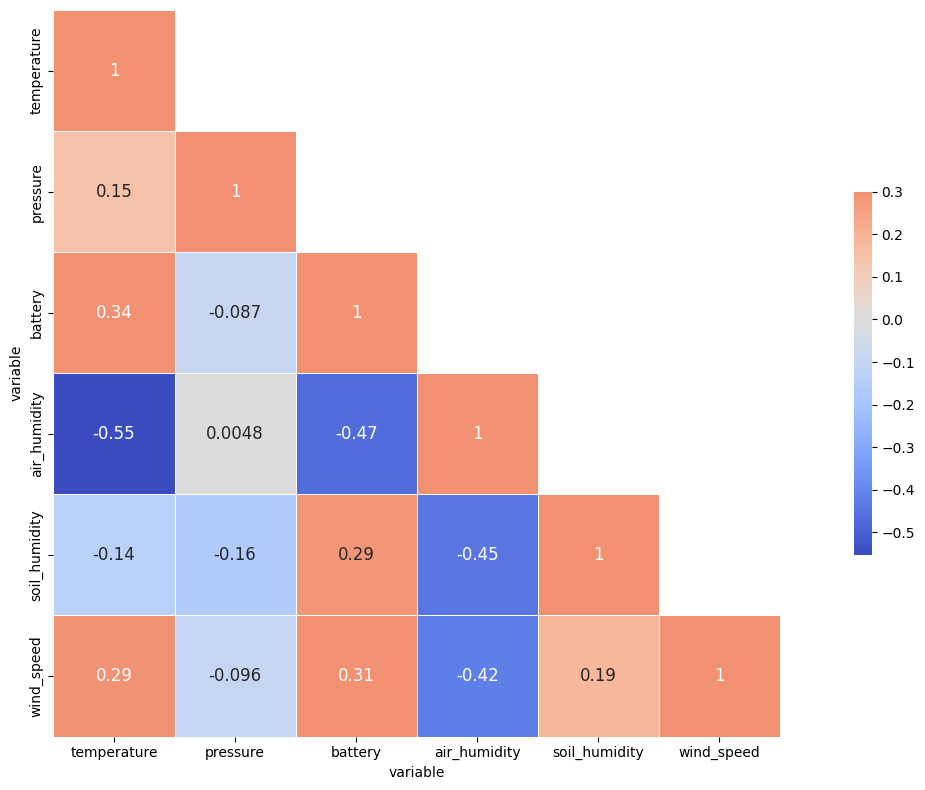

In [47]:
for sensor_id, dataset in sensors_data_clean.items():
    print(" ")
    print(f"Información correspondiente al sensor {sensor_id}:")
    print("-------------------------------------------------------------------------------------------------------------------------------------")
    #dataset = dataset.drop(columns=["wind_direction"])
    correlacion(dataset, f"corr{sensor_id}_2")

In [48]:
for sensor_id, df in sensors_data_clean.items():
    display(df)

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-04-05 20:15:00,25.94,986.72,91.49,38.95,26.77,0.00
2018-04-05 21:00:00,20.58,986.72,91.49,39.27,27.52,0.00
2018-04-05 21:45:00,21.76,986.77,90.70,37.55,29.30,0.00
2018-04-05 22:30:00,20.45,986.78,90.54,39.85,29.38,0.00
2018-04-05 23:15:00,20.01,986.93,94.18,40.82,26.77,0.00
...,...,...,...,...,...,...
2018-10-31 20:15:00,10.27,979.06,76.51,79.94,26.52,1.92
2018-10-31 21:00:00,10.21,978.91,75.86,79.53,27.29,3.76
2018-10-31 21:45:00,10.34,979.21,75.04,79.72,26.65,4.24


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-04-13 20:15:00,21.29,977.62,91.49,40.32,26.98,0.00
2018-04-13 21:00:00,19.70,978.29,81.89,45.67,26.25,0.00
2018-04-13 21:45:00,19.48,979.36,75.86,50.12,25.44,0.00
2018-04-13 22:30:00,19.18,980.09,74.71,50.56,25.52,0.00
2018-04-13 23:15:00,19.26,980.89,73.56,50.16,25.69,0.00
...,...,...,...,...,...,...
2018-09-18 23:15:00,21.36,980.78,4.04,78.08,41.71,2.41
2018-09-19 00:00:00,20.98,980.77,2.20,78.08,44.72,0.00
2018-09-19 00:45:00,21.18,980.90,1.32,78.08,44.33,2.41


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-08-23 12:45:00,31.38,984.22,86.20,54.52,80.58,0.00
2018-08-23 13:30:00,29.51,984.38,82.70,58.58,64.68,0.00
2018-08-23 15:00:00,28.65,983.79,83.03,69.55,66.80,2.41
2018-08-23 15:45:00,29.94,986.54,82.38,58.74,68.44,0.00
2018-08-23 16:30:00,36.75,985.33,84.17,51.40,70.02,0.00
...,...,...,...,...,...,...
2018-10-03 00:45:00,11.37,991.27,5.74,55.39,56.28,0.00
2018-10-03 01:30:00,10.85,991.26,4.81,56.46,55.70,0.00
2018-10-03 02:15:00,10.48,991.73,5.15,58.34,55.10,0.00


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-04-27 09:45:00,27.97,1002.57,93.70,39.48,27.19,0.00
2018-04-27 17:15:00,28.05,1001.41,86.63,61.27,21.23,0.00
2018-04-27 18:00:00,28.05,1001.30,92.75,63.45,21.26,0.00
2018-04-30 12:45:00,23.79,986.79,90.54,49.44,24.26,0.00
2018-04-30 13:30:00,23.74,986.63,87.49,49.28,26.11,0.00
...,...,...,...,...,...,...
2018-10-31 20:15:00,11.07,997.07,66.87,79.88,50.99,9.92
2018-10-31 21:00:00,10.64,997.38,66.29,79.88,48.77,5.12
2018-10-31 21:45:00,10.23,997.81,65.42,79.88,56.94,10.56


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-05-08 19:30:00,28.69,1006.35,87.93,56.93,18.74,0.00
2018-05-10 13:30:00,28.69,1006.35,87.49,56.93,25.71,0.00
2018-05-10 14:15:00,28.69,1006.35,91.49,56.93,67.73,0.00
2018-05-10 15:00:00,26.81,1006.28,87.93,36.73,73.17,0.00
2018-05-10 15:45:00,26.24,1006.18,86.06,35.26,72.42,0.00
...,...,...,...,...,...,...
2018-10-10 22:30:00,15.46,983.92,70.77,77.55,73.92,0.00
2018-10-10 23:15:00,14.75,984.05,69.79,78.42,74.02,0.00
2018-10-15 03:00:00,14.15,977.49,25.68,66.25,76.24,2.41


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-04-25 21:00:00,29.49,1002.30,81.73,26.10,27.06,0.0
2018-05-02 09:45:00,29.49,1002.30,87.21,26.10,22.99,0.0
2018-05-02 10:30:00,29.49,1002.30,86.92,26.10,23.82,0.0
2018-05-02 11:15:00,29.49,1002.30,86.78,26.10,23.78,0.0
2018-05-02 12:00:00,29.49,1002.30,88.21,26.10,24.32,0.0
...,...,...,...,...,...,...
2018-06-26 16:30:00,28.60,1007.22,87.06,41.79,45.45,0.0
2018-06-26 17:15:00,29.14,1007.02,85.91,42.93,54.33,0.0
2018-06-28 18:45:00,30.18,1000.07,85.48,52.46,54.93,0.0


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-04-01 00:00:00,14.33,1006.23,78.79,23.78,20.54,4.16
2018-04-01 00:45:00,14.24,1006.75,76.67,24.37,19.74,4.16
2018-04-01 01:30:00,14.25,1006.88,75.37,25.32,20.05,4.16
2018-04-01 02:15:00,12.99,1006.63,74.05,28.91,18.74,2.08
2018-04-01 03:00:00,12.56,1007.03,73.07,32.43,20.25,6.23
...,...,...,...,...,...,...
2018-09-14 12:45:00,23.57,1009.43,88.07,60.24,13.65,0.00
2018-09-14 13:30:00,28.12,1009.49,93.39,58.89,14.90,0.00
2018-09-14 14:15:00,27.07,1010.66,86.92,54.70,14.48,0.00


In [49]:
# Para la correlación bien, pero ahora hay que quitar la batería.
#num_cols = sensors_data_clean["270043001951343334363036"].select_dtypes(include=['float64', 'int64']).columns
#num_cols

In [50]:
num_cols2 = ["temperature", "pressure", "air_humidity", "soil_humidity", "wind_speed"]

### Normalización de las variables para apalicar la regresión lineal múltiple

In [51]:
sensors_data_clean["270043001951343334363036"].head()

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed
fecha,,,,,,
2018-04-05 20:15:00,25.94,986.72,91.49,38.95,26.77,0.0
2018-04-05 21:00:00,20.58,986.72,91.49,39.27,27.52,0.0
2018-04-05 21:45:00,21.76,986.77,90.70,37.55,29.30,0.0
2018-04-05 22:30:00,20.45,986.78,90.54,39.85,29.38,0.0
2018-04-05 23:15:00,20.01,986.93,94.18,40.82,26.77,0.0


In [52]:
sensors_data_clean["270043001951343334363036"][["battery"]].head()

variable,battery
fecha,
2018-04-05 20:15:00,91.49
2018-04-05 21:00:00,91.49
2018-04-05 21:45:00,90.70
2018-04-05 22:30:00,90.54
2018-04-05 23:15:00,94.18


In [53]:
from sklearn.preprocessing import MinMaxScaler

# Selecciona solo las columnas predictoras
X = sensors_data_clean["270043001951343334363036"][["temperature", "pressure", "air_humidity", "soil_humidity", "wind_speed"]]

# Crea el escalador Min-Max
scaler = MinMaxScaler()

# Ajusta y transforma los datos
X_normalized = scaler.fit_transform(X)

# Convierte los datos normalizados a un DataFrame para que sea fácil de usar
X_normalized_df = pd.DataFrame(X_normalized, columns=X.columns)

# Agrega la variable objetivo de nuevo al DataFrame normalizado
df_normalized = X_normalized_df.copy()
df_normalized["battery"] = sensors_data_clean["270043001951343334363036"]["battery"].values


In [54]:
df_normalized.head()

variable,temperature,pressure,air_humidity,soil_humidity,wind_speed,battery
0,0.475335,0.503172,0.315886,0.227460,0.0,91.49
1,0.339742,0.503172,0.321220,0.237736,0.0,91.49
2,0.369593,0.504392,0.292549,0.262127,0.0,90.70
3,0.336453,0.504636,0.330888,0.263223,0.0,90.54
4,0.325323,0.508297,0.347058,0.227460,0.0,94.18


In [55]:
import statsmodels.api as sm
# Regresión lineal multiple

# Definir las variables dependiente e independiente
X = sensors_data_clean["270043001951343334363036"][num_cols2]  # Variables predictoras
y = sensors_data_clean["270043001951343334363036"]["battery"]  # Variable dependiente

# Agregar una constante (intercepto) al modelo
X = sm.add_constant(X)

# Ajustar el modelo de regresión lineal múltiple
modelo = sm.OLS(y, X).fit()

### Hay que escalar las variables

In [56]:
# Mostrar el resumen del modelo
print(modelo.summary())

                            OLS Regression Results                            
Dep. Variable:                battery   R-squared:                       0.400
Model:                            OLS   Adj. R-squared:                  0.399
Method:                 Least Squares   F-statistic:                     607.9
Date:                Tue, 19 Nov 2024   Prob (F-statistic):               0.00
Time:                        13:12:41   Log-Likelihood:                -18091.
No. Observations:                4566   AIC:                         3.619e+04
Df Residuals:                    4560   BIC:                         3.623e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           759.9134     57.190     13.287

### Regresión lineal robusta

In [57]:
X = sm.add_constant(X)  # Agrega una constante para el intercepto

In [58]:
# Ajusta el modelo robusto
robust_model = sm.RLM(y, X, M=sm.robust.norms.HuberT())
robust_results = robust_model.fit()

In [59]:
print(robust_results.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:                battery   No. Observations:                 4566
Model:                            RLM   Df Residuals:                     4560
Method:                          IRLS   Df Model:                            5
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Tue, 19 Nov 2024                                         
Time:                        13:12:42                                         
No. Iterations:                    20                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const           709.6233     55.488     12.789

In [60]:
def plot_variables(df):
    num_vars = len(df.columns)
    fig, axes = plt.subplots(num_vars, 1, figsize=(10, 4 * num_vars), sharex=True)

    # Graficar cada variable en un subplot separado
    for ax, column in zip(axes, df.columns):
        ax.plot(df.index, df[column], marker="o", label=column, color="b")
        ax.set_title(f"{column}", fontsize=14)
        ax.set_ylabel("Valor", fontsize=12)
        ax.grid(True)
        ax.legend(fontsize=10)

    # Personalización del eje X
    plt.xlabel("Fecha y Hora", fontsize=12)
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Mostrar los gráficos
    plt.show()

sensor 270043001951343334363036


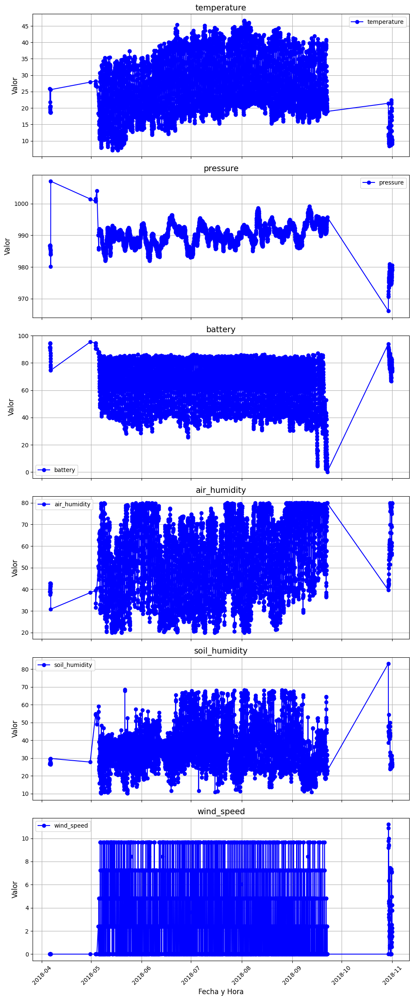

sensor 380033001951343334363036


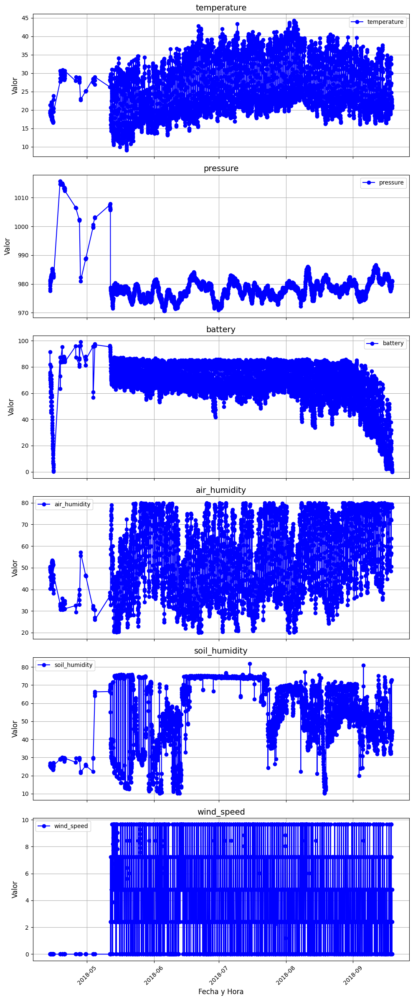

sensor 46005a000351353337353037


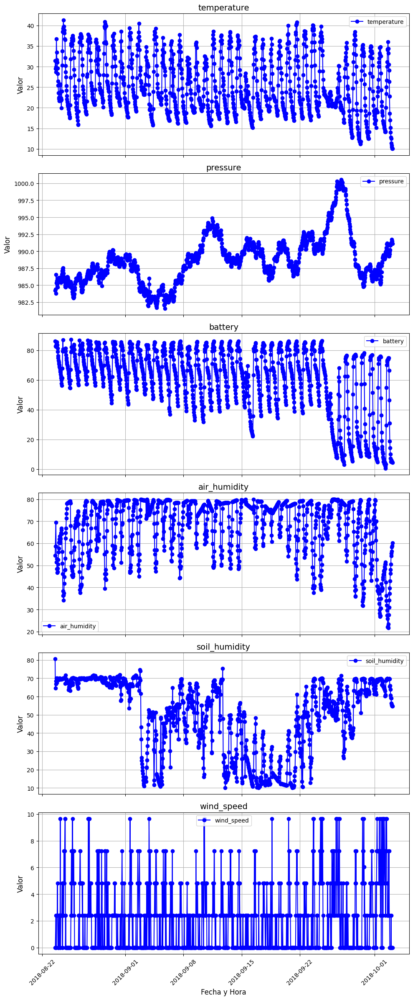

sensor 4e0022000251353337353037


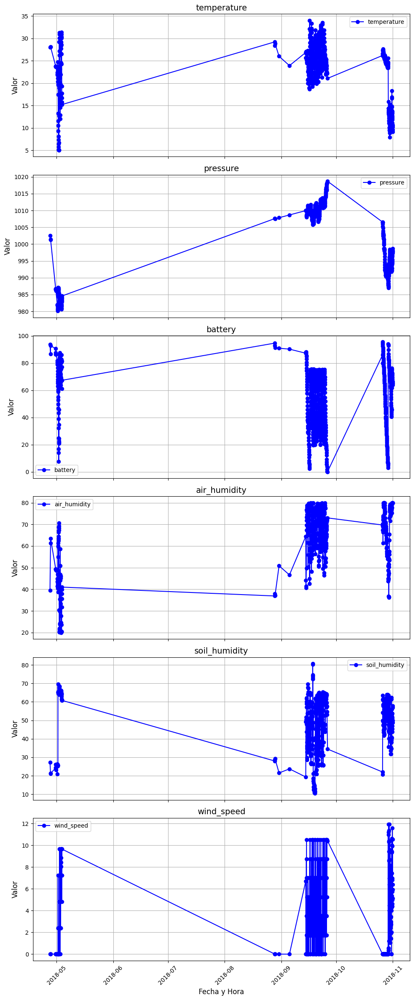

sensor 4e0031000251353337353037


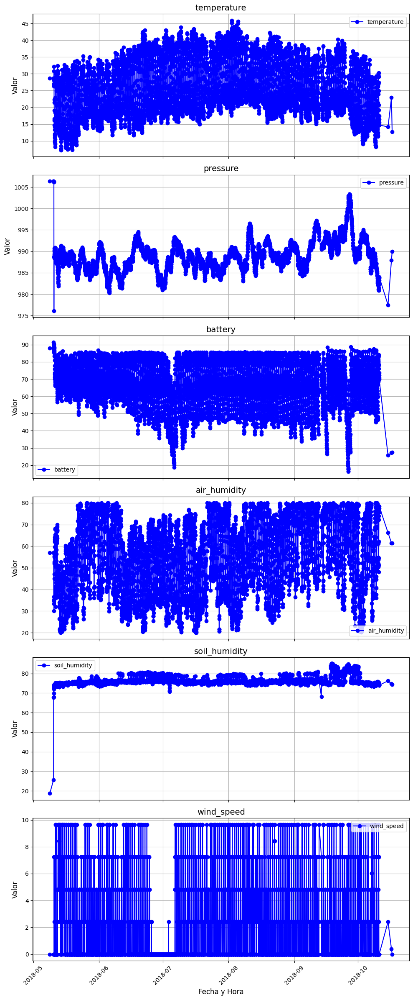

sensor 46004e000251353337353037


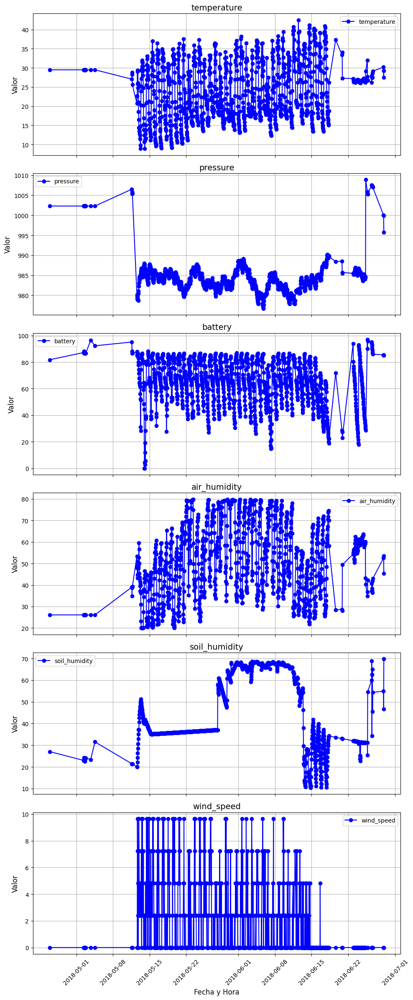

sensor 200034001951343334363036


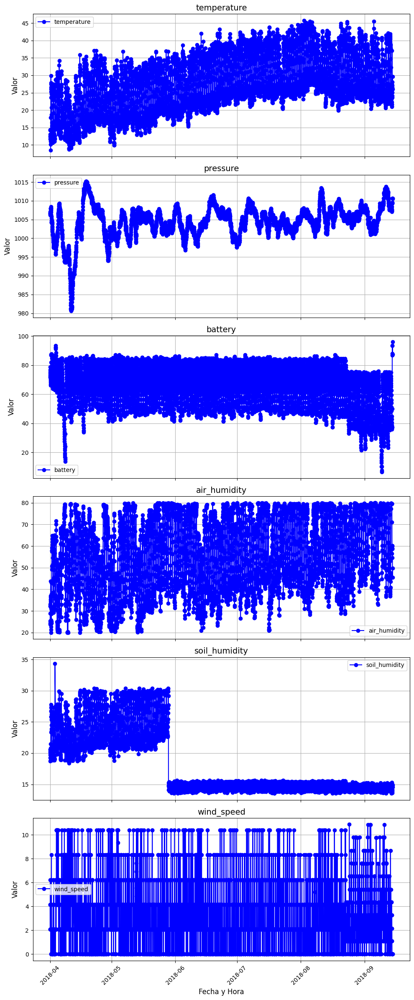

In [61]:
for sensor_id, df in sensors_data_clean.items():
    print(f"sensor {sensor_id}")
    plot_variables(df)

In [62]:
puntos_corte = {'270043001951343334363036': ("2018-05-06","2018-09-20"),
                '380033001951343334363036': ("2018-05-12","2018-09-19"),
                '46005a000351353337353037': ("2018-08-24","2018-10-03"),
                '4e0022000251353337353037': ("2018-09-15","2018-09-20"),
                '4e0031000251353337353037': ("2018-05-12","2018-10-15"),#28-10-15
                '46004e000251353337353037': ("2018-05-14","2018-06-15"),
                '200034001951343334363036': ("2018-04-02","2018-09-14")}
puntos_corte

{'270043001951343334363036': ('2018-05-06', '2018-09-20'),
 '380033001951343334363036': ('2018-05-12', '2018-09-19'),
 '46005a000351353337353037': ('2018-08-24', '2018-10-03'),
 '4e0022000251353337353037': ('2018-09-15', '2018-09-20'),
 '4e0031000251353337353037': ('2018-05-12', '2018-10-15'),
 '46004e000251353337353037': ('2018-05-14', '2018-06-15'),
 '200034001951343334363036': ('2018-04-02', '2018-09-14')}

In [63]:
def clean_dataframe_by_date(df, cut_date):
    # Convertir el índice a datetime (en caso de que no esté en este formato)
    df.index = pd.to_datetime(df.index)
    
    # Convertir las fechas de corte a datetime
    start_date, end_date = pd.to_datetime(cut_date[0]), pd.to_datetime(cut_date[1])
    
    # Filtrar los registros que están dentro del intervalo de fechas
    df_cleaned = df[(df.index >= start_date) & (df.index <= end_date)]
    
    
    # Convertir la fecha de corte a datetime
    #cut_date = pd.to_datetime(cut_date)
    
    # Filtrar los registros que son posteriores a la fecha de corte
    #df_cleaned = df[df.index >= cut_date]
    
    return df_cleaned

In [64]:
# Aplicamos la limpieza a todos los DataFrames en el diccionario
sensors_data_clean_plus = {}
for sensor_id, df in sensors_data_clean.items():
    # Obtenemos la fecha de corte para el sensor
    cut_date = puntos_corte.get(sensor_id)
    
    if cut_date:
        # Aplicamos la función de limpieza
        sensors_data_clean_plus[sensor_id] = clean_dataframe_by_date(df, cut_date)

sensor 270043001951343334363036


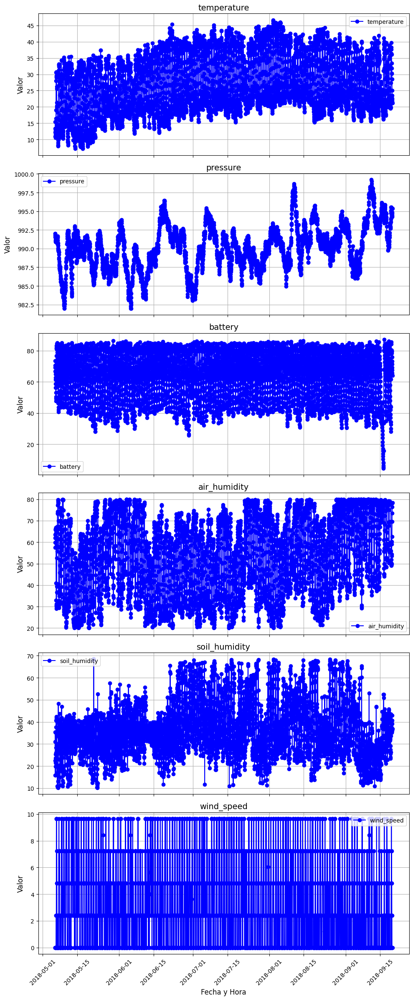

sensor 380033001951343334363036


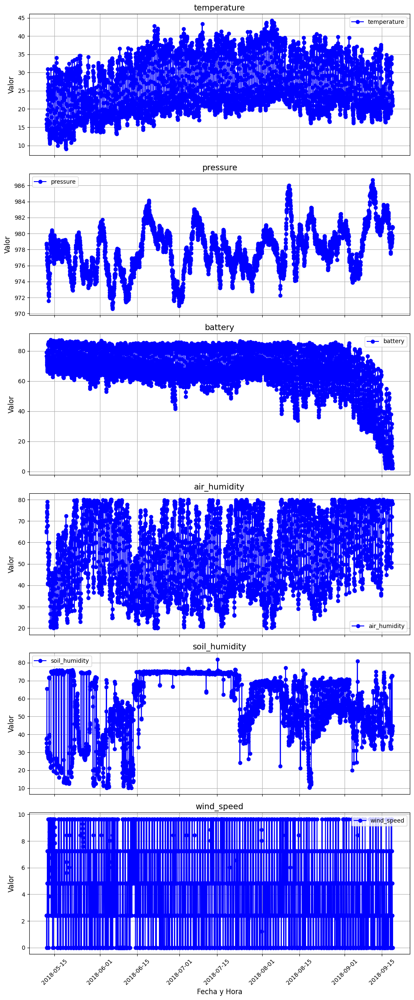

sensor 46005a000351353337353037


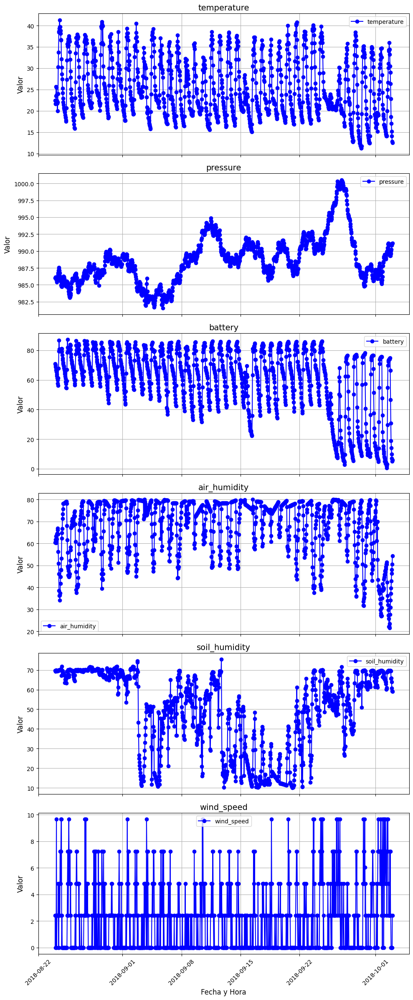

sensor 4e0022000251353337353037


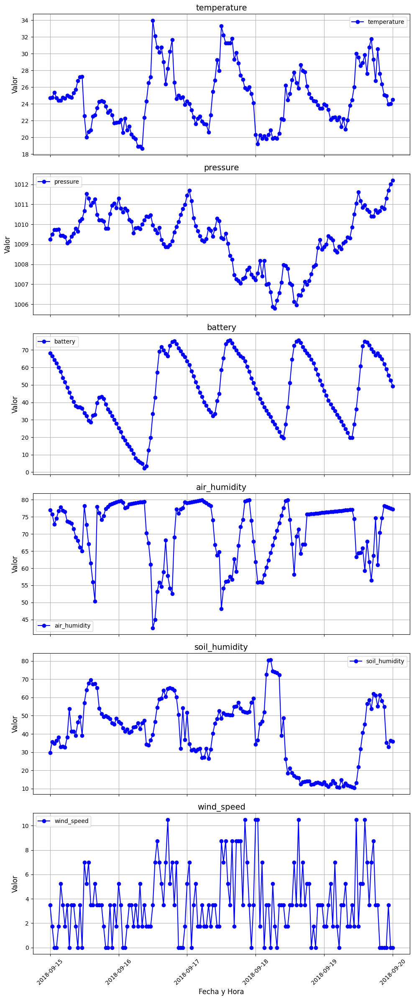

sensor 4e0031000251353337353037


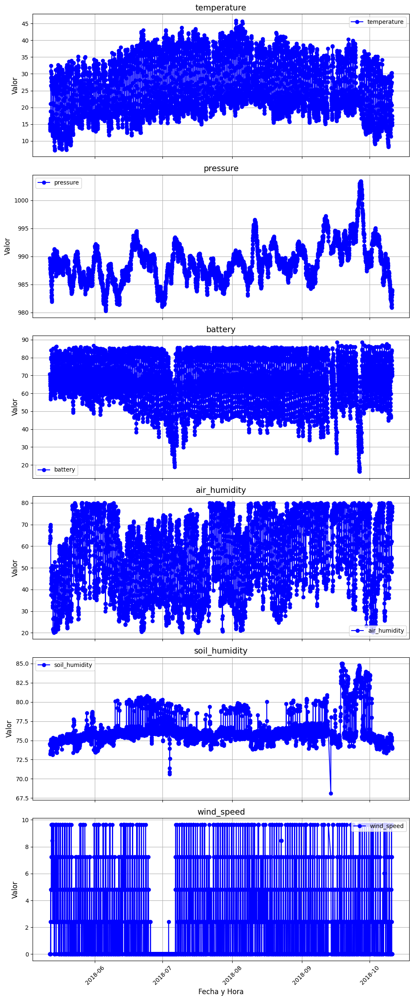

sensor 46004e000251353337353037


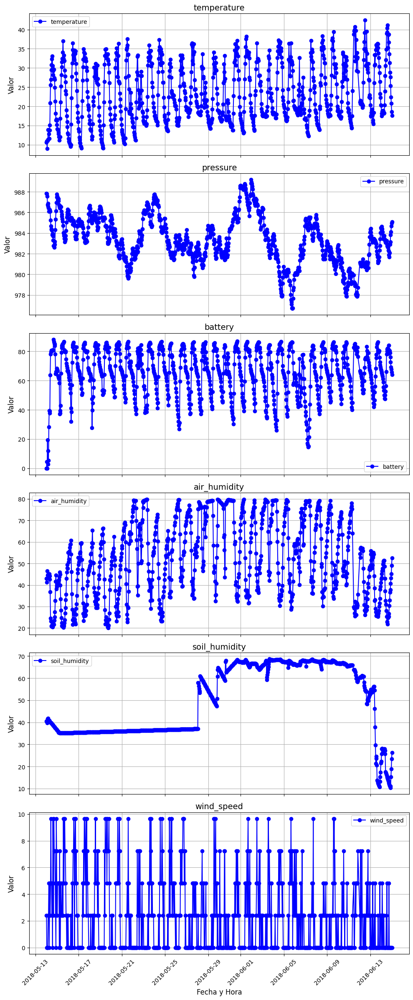

sensor 200034001951343334363036


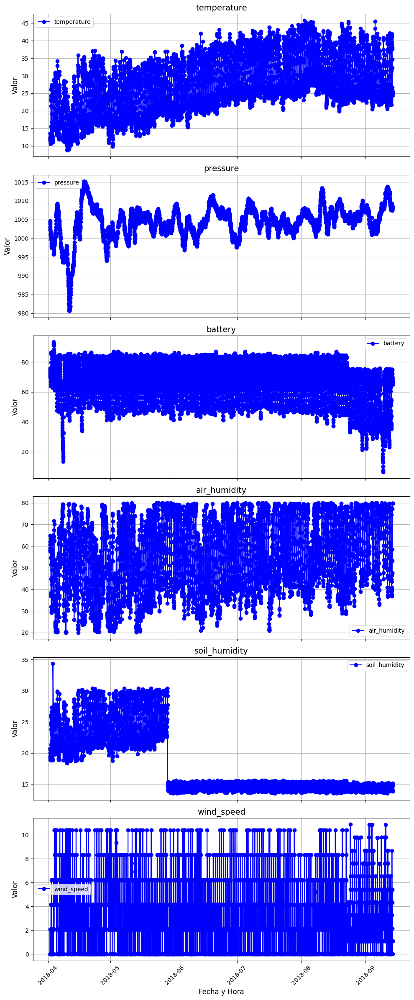

In [65]:
for sensor_id, df in sensors_data_clean_plus.items():
    print(f"sensor {sensor_id}")
    plot_variables(df)

### Punto 5

In [66]:
#inter = "daily"
inter = "hourly"

In [67]:
# Función para obtener la radiación solar directa normal usando la API de NASA POWER
def get_solar_irradiance(latitude, longitude, start_date, end_date):
    """
    Consulta la NASA POWER API para obtener datos de irradiancia solar diaria.

    Parámetros:
        latitude (float): Latitud de la ubicación (en grados decimales).
        longitude (float): Longitud de la ubicación (en grados decimales).
        start_date (str): Fecha de inicio para la consulta, en formato 'YYYYMMDD'.
        end_date (str): Fecha de fin para la consulta, en formato 'YYYYMMDD'.

    Retorna:
        list: Lista de valores de radiación solar directa normal (en unidades de W/m²),
              o None si ocurre un error en la solicitud.
    """
    
    # URL de la API de NASA POWER, configurando el parámetro temporal
    url = f"https://power.larc.nasa.gov/api/temporal/{inter}/point"  # Aquí 'inter' parece ser una variable no definida

    # Definir los parámetros de la solicitud a la API
    params = {
        'start': start_date,  # Fecha de inicio del rango solicitado
        'end': end_date,      # Fecha de fin del rango solicitado
        'latitude': latitude,  # Latitud de la ubicación
        'longitude': longitude,  # Longitud de la ubicación
        'parameters': 'ALLSKY_SFC_SW_DWN',  # Parámetro de irradiancia solar directa normal
        'community': 'RE',  # Comunidad de Energías Renovables (RE)
        'format': 'JSON'  # Formato de respuesta (JSON)
    }
    
    # Realizar la solicitud GET a la API de NASA POWER
    response = requests.get(url, params=params)
    
    # Verificar si la respuesta es exitosa (código 200)
    if response.status_code == 200:
        # Parsear los datos JSON de la respuesta
        data = response.json()
        
        # Extraer los datos de irradiancia de la respuesta JSON
        irradiance_data = data.get('properties', {}).get('parameter', {}).get('ALLSKY_SFC_SW_DWN', [])
        
        # Retornar los datos de irradiancia solar
        return irradiance_data 
    else:
        # Si la respuesta no es exitosa, retornar None
        return None


In [68]:
# Diccionario con la localización de los sensores (Longitud y Latitud)
sensors_loc = {
    "270043001951343334363036": (40.133098, -0.061000),
    "380033001951343334363036": (40.206870, 0.015536),
    "46005a000351353337353037": (40.141384, -0.026397),
    "4e0022000251353337353037": (40.167529, -0.097165),
    "4e0031000251353337353037": (40.1138985, -0.0519082),
    "46004e000251353337353037": (40.1138985, -0.0519082),
    "200034001951343334363036": (40.1138985, -0.0519082)
    }

In [69]:
# Lista con los identificadores de los sensores
sensor_ids = [
    "270043001951343334363036",
    "380033001951343334363036",
    "46005a000351353337353037",
    "4e0022000251353337353037",
    "4e0031000251353337353037",
    "46004e000251353337353037",
    "200034001951343334363036",
    ]

In [70]:
fecha_inicio = "20180101"
fecha_fin = "20181231"
irradiacion_datos = {}
for sensor_id in sensor_ids:
    irrad = get_solar_irradiance(sensors_loc[sensor_id][0], sensors_loc[sensor_id][1], fecha_inicio, fecha_fin)
    irradiacion_datos[sensor_id] = irrad

In [71]:
#formato_tiempo = "%Y%m%d"
formato_tiempo = "%Y%m%d%H"
sensors_data_clean_plus["200034001951343334363036"]["fecha_str"] = sensors_data_clean_plus["200034001951343334363036"].index.strftime(formato_tiempo)

/tmp/ipykernel_169778/3385737705.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus["200034001951343334363036"]["fecha_str"] = sensors_data_clean_plus["200034001951343334363036"].index.strftime(formato_tiempo)


In [72]:
sensors_data_clean_plus["200034001951343334363036"].head()

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,fecha_str
fecha,,,,,,,
2018-04-02 00:00:00,13.56,1004.63,76.02,57.87,20.03,0.00,2018040200
2018-04-02 00:45:00,13.48,1004.14,74.38,57.51,19.32,2.08,2018040200
2018-04-02 01:30:00,12.49,1003.83,73.40,59.11,19.44,0.00,2018040201
2018-04-02 02:15:00,11.71,1003.20,72.41,58.01,20.73,0.00,2018040202
2018-04-02 03:00:00,12.22,1002.84,71.59,60.68,20.52,0.00,2018040203


In [73]:
#irradiacion_datos["270043001951343334363036"]

In [74]:
#formato_tiempo = "%Y%m%d"
formato_tiempo = "%Y%m%d%H"
for sensor_id, df in sensors_data_clean_plus.items():
    sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
    sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
    sensors_data_clean_plus[sensor_id].drop(["fecha_str"], axis=1, inplace=True)
    display(sensors_data_clean_plus[sensor_id].sample(10))

/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-05-19 17:15:00,32.03,988.93,79.77,20.06,40.42,7.24,109.66
2018-07-28 16:30:00,39.64,986.69,79.77,33.18,33.62,7.24,486.27
2018-06-23 17:15:00,36.44,991.59,81.07,29.93,30.78,9.65,208.49
2018-09-04 15:00:00,38.91,986.72,79.93,38.22,47.34,7.24,346.42
2018-06-14 11:15:00,35.55,988.77,76.34,23.37,32.62,7.24,867.00
2018-06-02 11:15:00,32.89,992.57,82.54,40.82,32.06,7.24,700.91
2018-07-29 09:45:00,35.16,989.21,48.09,46.62,38.99,2.41,785.76
2018-08-14 04:30:00,22.70,989.84,56.31,72.27,40.24,0.00,0.00
2018-07-07 16:30:00,38.91,992.86,79.77,27.89,21.77,7.24,469.23


/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-05-20 03:45:00,13.26,977.26,68.97,51.34,75.08,2.41,0.00
2018-05-30 03:45:00,16.58,974.26,66.87,76.94,70.06,0.00,0.00
2018-06-17 13:30:00,33.96,981.69,79.44,30.86,75.23,4.82,693.02
2018-06-30 12:45:00,34.19,972.60,84.34,41.55,74.71,9.65,916.25
2018-05-26 03:00:00,15.46,975.04,69.46,79.79,27.41,2.41,0.00
2018-08-12 19:30:00,26.16,976.16,66.58,50.86,69.62,4.82,0.00
2018-08-13 08:15:00,25.16,974.99,39.75,75.36,71.91,0.00,523.02
2018-09-10 16:30:00,27.12,984.61,64.84,58.19,40.82,7.24,196.58
2018-07-06 04:30:00,19.13,981.50,63.11,58.38,74.33,0.00,6.81


/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-09-28 20:15:00,21.09,987.72,32.12,53.35,68.00,0.00,0.00
2018-09-10 23:15:00,19.00,993.97,64.84,79.02,59.58,0.00,0.00
2018-09-06 11:15:00,35.24,983.75,81.56,57.79,51.61,2.41,576.50
2018-09-08 08:15:00,18.67,988.70,39.02,79.18,34.51,0.00,428.83
2018-09-29 15:45:00,33.70,984.76,77.16,35.53,69.79,7.24,392.35
2018-09-09 12:45:00,35.93,989.45,82.21,60.23,67.32,2.41,470.67
2018-09-30 09:45:00,24.65,987.70,36.50,70.12,67.42,2.41,588.51
2018-09-29 09:00:00,19.33,986.55,22.24,74.08,51.01,0.00,606.65
2018-09-09 09:45:00,26.81,989.20,56.00,79.22,41.15,0.00,610.97


/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-09-16 07:30:00,18.92,1009.78,5.66,79.26,42.75,5.26,264.38
2018-09-20 00:00:00,24.53,1012.21,49.24,77.28,35.84,0.00,0.00
2018-09-15 00:00:00,24.69,1009.24,68.17,77.05,29.65,3.50,0.00
2018-09-16 09:45:00,24.30,1010.40,3.53,70.28,34.18,1.75,614.27
2018-09-15 15:00:00,22.51,1011.09,32.55,55.92,67.30,3.50,252.95
2018-09-16 09:00:00,22.37,1010.22,2.34,79.48,47.29,3.50,614.27
2018-09-17 11:15:00,27.99,1010.17,44.87,64.80,52.67,1.75,720.13
2018-09-17 18:00:00,28.88,1007.18,68.02,66.60,57.30,8.76,0.00
2018-09-15 13:30:00,20.68,1011.30,29.54,67.09,67.76,7.01,447.23


/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-07-01 22:30:00,25.66,983.69,66.29,56.92,78.92,0.00,0.00
2018-06-19 10:30:00,37.42,994.21,77.81,32.93,76.14,2.41,916.30
2018-08-19 11:15:00,37.50,993.47,82.54,33.44,75.72,2.41,895.45
2018-09-11 15:00:00,33.59,995.84,85.05,45.12,75.85,7.24,292.16
2018-06-14 06:45:00,16.89,986.61,55.36,53.64,75.68,2.41,226.59
2018-09-25 06:45:00,21.73,995.97,56.00,58.00,82.57,2.41,47.26
2018-06-24 01:30:00,18.99,990.68,63.11,62.03,80.79,0.00,0.00
2018-07-26 22:30:00,25.00,986.04,67.73,67.24,78.86,0.00,0.00
2018-09-27 01:30:00,19.89,1003.08,37.94,78.19,83.01,0.00,0.00


/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-05-27 18:45:00,24.43,981.73,74.88,57.11,37.02,2.41,32.28
2018-05-16 09:45:00,31.21,985.29,72.25,28.66,35.28,4.82,723.91
2018-05-25 00:00:00,16.43,985.43,65.86,47.54,36.60,0.00,0.00
2018-05-21 05:15:00,10.51,981.54,54.41,66.59,36.02,0.00,56.66
2018-06-04 03:00:00,18.11,983.28,40.11,79.27,68.25,0.00,0.00
2018-06-09 03:00:00,17.34,982.71,61.06,72.34,67.44,0.00,0.00
2018-06-10 07:30:00,18.73,981.44,44.05,73.27,66.63,2.41,296.73
2018-05-23 02:15:00,15.63,986.19,54.10,79.27,36.31,0.00,0.00
2018-05-23 00:45:00,15.99,986.00,56.00,79.15,36.30,0.00,0.00


/tmp/ipykernel_169778/2425712852.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["fecha_str"] = sensors_data_clean_plus[sensor_id].index.strftime(formato_tiempo)
/tmp/ipykernel_169778/2425712852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensors_data_clean_plus[sensor_id]["irradiancia"] = sensors_data_clean_plus[sensor_id]["fecha_str"].map(irradiacion_datos[sensor_id])
/tmp/ipykernel_169778/2425712852.py:6: SettingWithCopyWarning: 
A value is trying to be set 

variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia
fecha,,,,,,,
2018-06-09 18:00:00,36.75,1001.60,83.20,29.40,15.25,2.08,37.44
2018-08-26 07:30:00,22.38,1005.60,38.66,62.73,14.86,1.09,256.31
2018-07-18 17:15:00,38.01,1004.06,81.24,43.75,14.75,8.31,273.49
2018-06-04 08:15:00,22.76,1001.63,46.50,77.31,14.01,0.00,596.52
2018-04-20 15:45:00,28.74,1011.88,82.21,40.07,27.39,4.16,486.38
2018-06-13 06:45:00,19.57,1003.30,52.31,51.58,14.86,2.08,175.37
2018-07-05 21:45:00,27.12,1007.84,78.46,65.62,14.71,2.08,0.00
2018-07-23 04:30:00,22.72,1005.96,61.06,76.81,14.03,0.00,0.00
2018-06-29 16:30:00,38.09,1000.20,82.87,37.18,15.34,6.23,438.41


sensor 270043001951343334363036


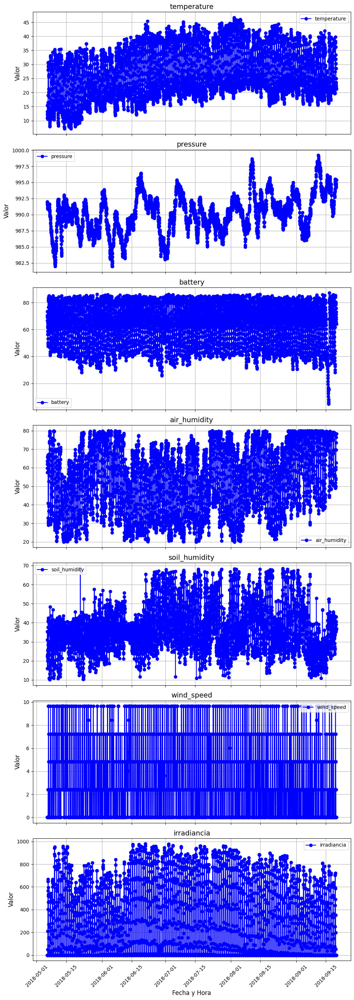

sensor 380033001951343334363036


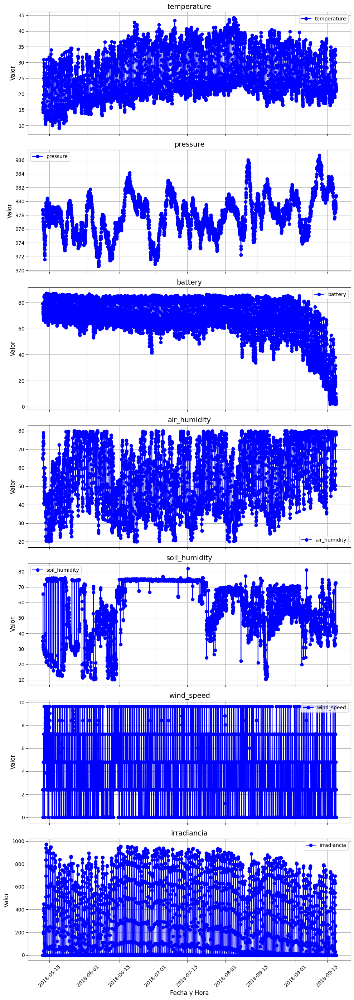

sensor 46005a000351353337353037


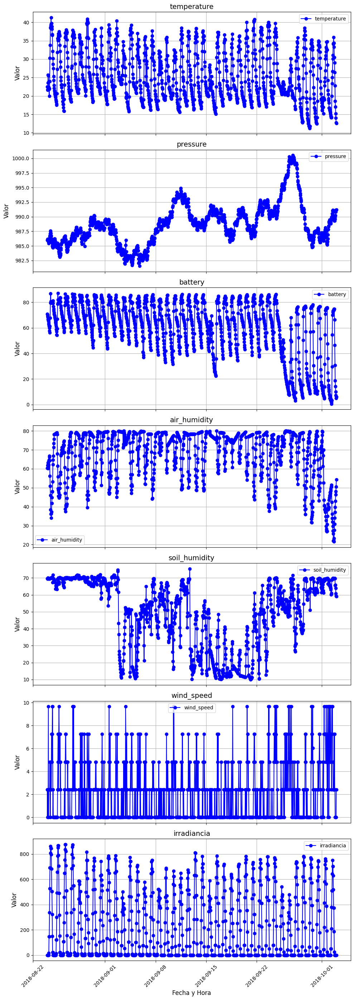

sensor 4e0022000251353337353037


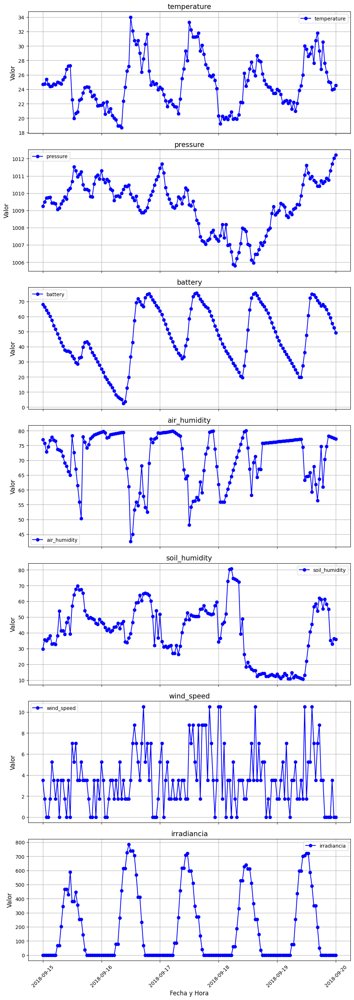

sensor 4e0031000251353337353037


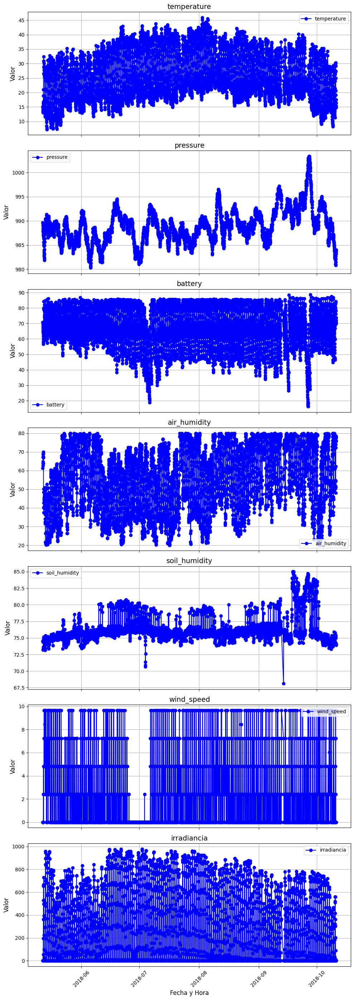

sensor 46004e000251353337353037


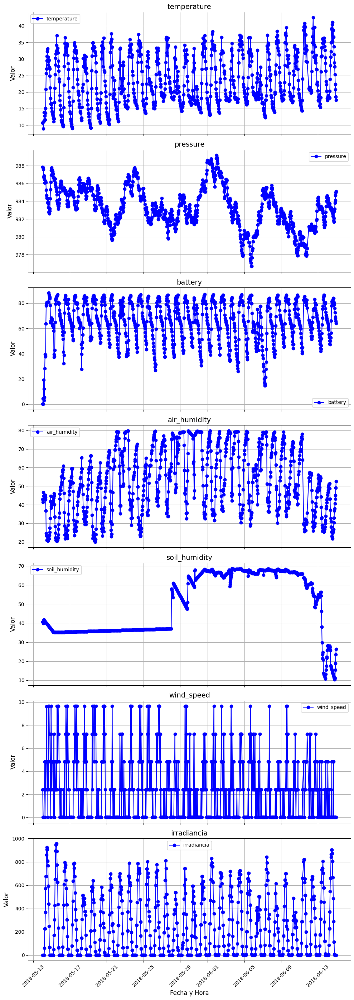

sensor 200034001951343334363036


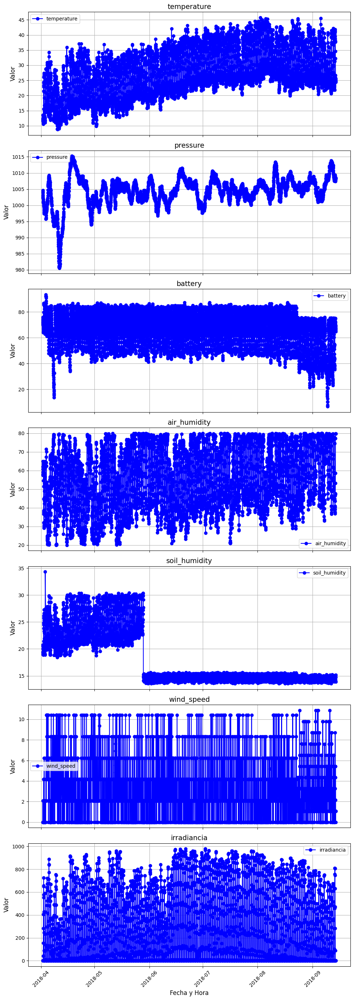

In [75]:
for sensor_id, df in sensors_data_clean_plus.items():
    print(f"sensor {sensor_id}")
    plot_variables(df)

In [76]:
sensor_ids

['270043001951343334363036',
 '380033001951343334363036',
 '46005a000351353337353037',
 '4e0022000251353337353037',
 '4e0031000251353337353037',
 '46004e000251353337353037',
 '200034001951343334363036']

In [77]:
# Función para obtener la duración del día (en segundos) para una fecha, latitud y longitud dados
def get_day_length(latitude, longitude, date):
    """
    Consulta la API Sunrise-Sunset para obtener la duración del día (day length) 
    para una ubicación específica y una fecha dada.

    Parámetros:
        latitude (float): Latitud de la ubicación (en grados decimales).
        longitude (float): Longitud de la ubicación (en grados decimales).
        date (str): Fecha para la cual obtener la duración del día, en formato 'YYYY-MM-DD'.

    Retorna:
        int o None: La duración del día en segundos, o None si la consulta falla.
    """
    
    # Construir la URL para la solicitud a la API Sunrise-Sunset
    url = f"https://api.sunrise-sunset.org/json?lat={latitude}&lng={longitude}&date={date}"

    # Realizar la solicitud GET a la API
    response = requests.get(url)

    # Parsear la respuesta JSON de la API
    sunrise_sunset = response.json()
    
    # Verificar si la respuesta de la API fue exitosa (código de estado 200)
    if response.status_code == 200:
        # Extraer y retornar la duración del día desde la respuesta JSON
        # Si no se encuentra el campo 'day_length', retornamos una cadena vacía
        return sunrise_sunset.get('results', {}).get('day_length', '')
    else:
        # Si la respuesta no es exitosa (código de estado diferente a 200), retornar None
        return None

In [78]:
for sensor_id, df in sensors_data_clean_plus.items():
    latitud = sensors_loc[sensor_id][0]
    longitud = sensors_loc[sensor_id][0]
    
    # Get unique dates in the DataFrame
    unique_dates = np.unique(df.index.date).tolist()
    unique_dates_str = [date.strftime('%Y-%m-%d') for date in unique_dates]

    # Create a dictionary to store day lengths for each date
    day_length_dict = {}
    
    # Iterate over unique dates and retrieve day length (only make API call once per unique date)
    for date in unique_dates:
        day_length = get_day_length(latitud, longitud, str(date))
        day_length_dict[str(date)] = day_length
        
    # Convert day lengths to minutes
    day_length_minutes = {date: int(day_length.split(':')[0]) * 60 + int(day_length.split(':')[1]) for date, day_length in day_length_dict.items()}

    # Convert day lengths to datetime
    day_length_date = {pd.to_datetime(k).date(): v for k, v in day_length_minutes.items()}  # Ensure dictionary keys are date objects
 
    # Map day lengths to a new column in the DataFrame based on the date
    df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))
    
    df.to_csv(f"{completos_dir}/{sensor_id}_limpios_{intervalo}.csv", index=True)
    
    df_to_image(df, f"../src/graficos_analisis/{sensor_id}_df_limpio")
    
    # Display the updated DataFrame
    display(df.head())

/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-05-06 00:00:00,15.46,992.01,73.40,57.55,35.42,0.0,0.0,848
2018-05-06 00:45:00,13.32,992.02,70.61,59.84,31.11,0.0,0.0,848
2018-05-06 01:30:00,12.25,991.81,69.13,61.96,22.52,0.0,0.0,848
2018-05-06 02:15:00,10.99,991.57,66.72,63.46,15.94,0.0,0.0,848
2018-05-06 03:00:00,10.54,991.39,64.84,66.20,21.58,0.0,0.0,848


/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-05-12 00:00:00,17.24,978.77,79.12,65.42,35.17,2.41,0.0,861
2018-05-12 00:45:00,15.93,978.57,76.67,64.75,37.40,2.41,0.0,861
2018-05-12 01:30:00,15.10,978.28,75.04,67.39,38.06,0.00,0.0,861
2018-05-12 02:15:00,14.92,978.10,73.40,69.95,32.87,2.41,0.0,861
2018-05-12 03:00:00,14.27,977.53,72.41,71.77,65.45,2.41,0.0,861


/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-08-24 00:00:00,22.46,986.00,70.94,60.43,69.66,2.41,0.0,807
2018-08-24 00:45:00,21.69,986.01,70.12,60.60,69.37,0.00,0.0,807
2018-08-24 01:30:00,21.62,986.14,68.97,61.83,69.42,2.41,0.0,807
2018-08-24 02:15:00,23.54,986.04,68.02,63.26,70.02,2.41,0.0,807
2018-08-24 03:00:00,25.72,985.90,66.72,60.18,69.73,0.00,0.0,807


/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-09-15 00:00:00,24.69,1009.24,68.17,77.05,29.65,3.50,0.0,751
2018-09-15 00:45:00,24.76,1009.50,66.43,75.81,35.67,1.75,0.0,751
2018-09-15 01:30:00,25.38,1009.73,64.27,72.88,34.84,0.00,0.0,751
2018-09-15 02:15:00,24.70,1009.74,62.39,74.58,36.27,0.00,0.0,751
2018-09-15 03:00:00,24.41,1009.76,60.11,76.73,38.16,1.75,0.0,751


/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-05-12 00:00:00,15.11,989.67,70.77,61.38,74.52,0.0,0.0,861
2018-05-12 00:45:00,14.07,989.43,69.79,62.61,74.56,0.0,0.0,861
2018-05-12 01:30:00,13.48,989.21,68.97,63.73,74.46,0.0,0.0,861
2018-05-12 02:15:00,13.88,988.99,67.88,64.72,74.52,0.0,0.0,861
2018-05-12 03:00:00,13.43,988.48,66.87,68.87,74.38,0.0,0.0,861


/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-05-14 00:45:00,10.67,987.84,0.02,42.95,40.57,2.41,0.0,864
2018-05-14 01:30:00,10.92,987.81,4.38,41.35,40.72,0.00,0.0,864
2018-05-14 02:15:00,8.95,987.58,0.07,46.54,39.82,0.00,0.0,864
2018-05-14 03:00:00,11.10,986.74,19.31,44.58,41.61,0.00,0.0,864
2018-05-14 03:45:00,11.34,986.89,2.85,44.75,41.77,0.00,0.0,864


/tmp/ipykernel_169778/4220732832.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["minutos_dia"] = df.index.to_series().apply(lambda x: day_length_date.get(x.date(), None))


qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


variable,temperature,pressure,battery,air_humidity,soil_humidity,wind_speed,irradiancia,minutos_dia
fecha,,,,,,,,
2018-04-02 00:00:00,13.56,1004.63,76.02,57.87,20.03,0.00,0.0,765
2018-04-02 00:45:00,13.48,1004.14,74.38,57.51,19.32,2.08,0.0,765
2018-04-02 01:30:00,12.49,1003.83,73.40,59.11,19.44,0.00,0.0,765
2018-04-02 02:15:00,11.71,1003.20,72.41,58.01,20.73,0.00,0.0,765
2018-04-02 03:00:00,12.22,1002.84,71.59,60.68,20.52,0.00,0.0,765


In [79]:
for sensor_id, df in sensors_data_clean_plus.items():
    df.to_csv(f"{completos_dir}/{sensor_id}_limpios_{intervalo}.csv", index=True)

 
Información correspondiente al sensor 270043001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


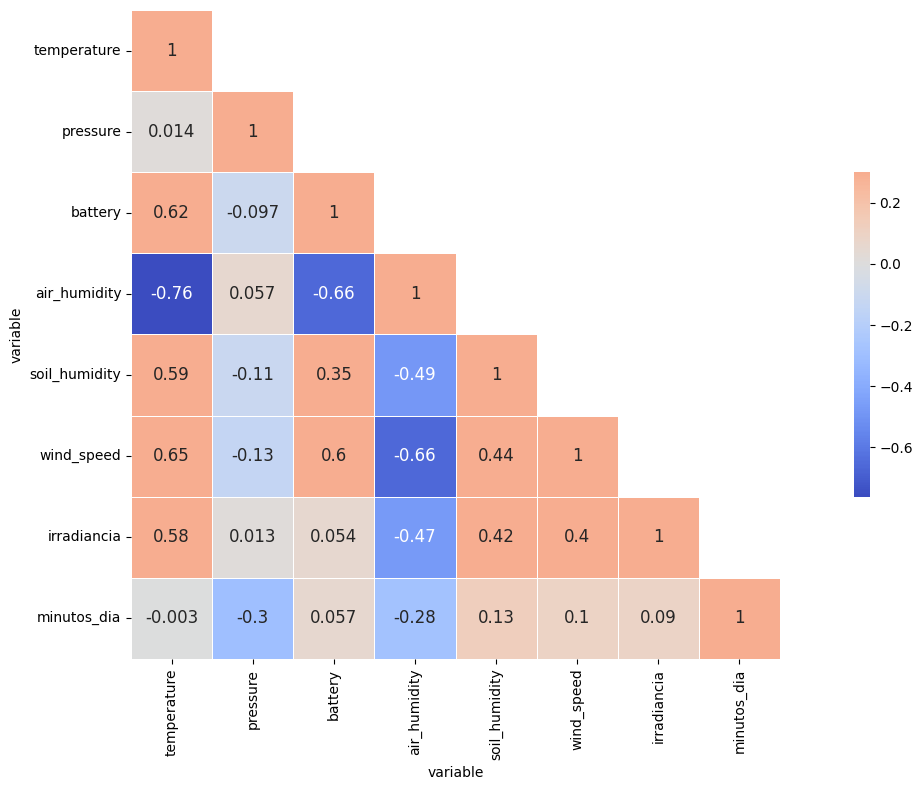

 
Información correspondiente al sensor 380033001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


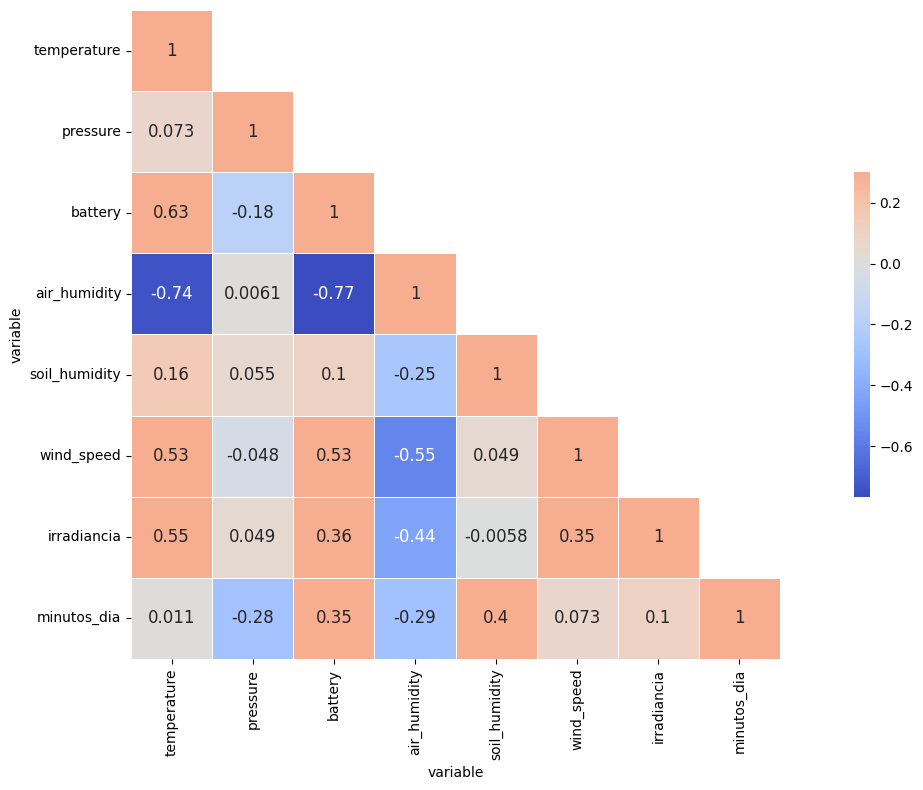

 
Información correspondiente al sensor 46005a000351353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


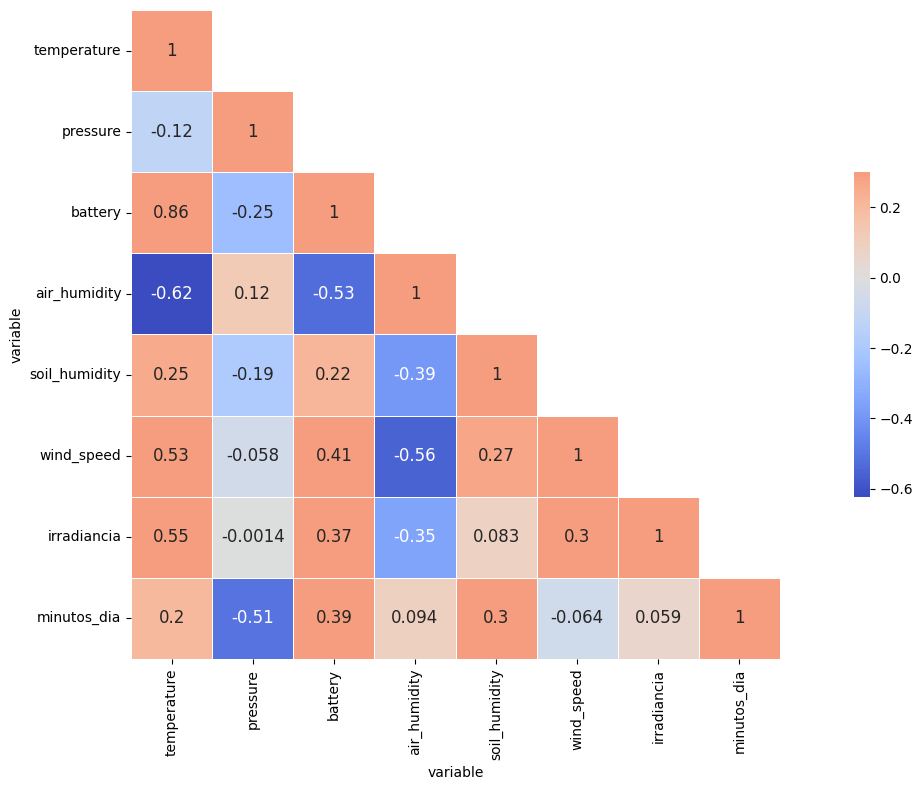

 
Información correspondiente al sensor 4e0022000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


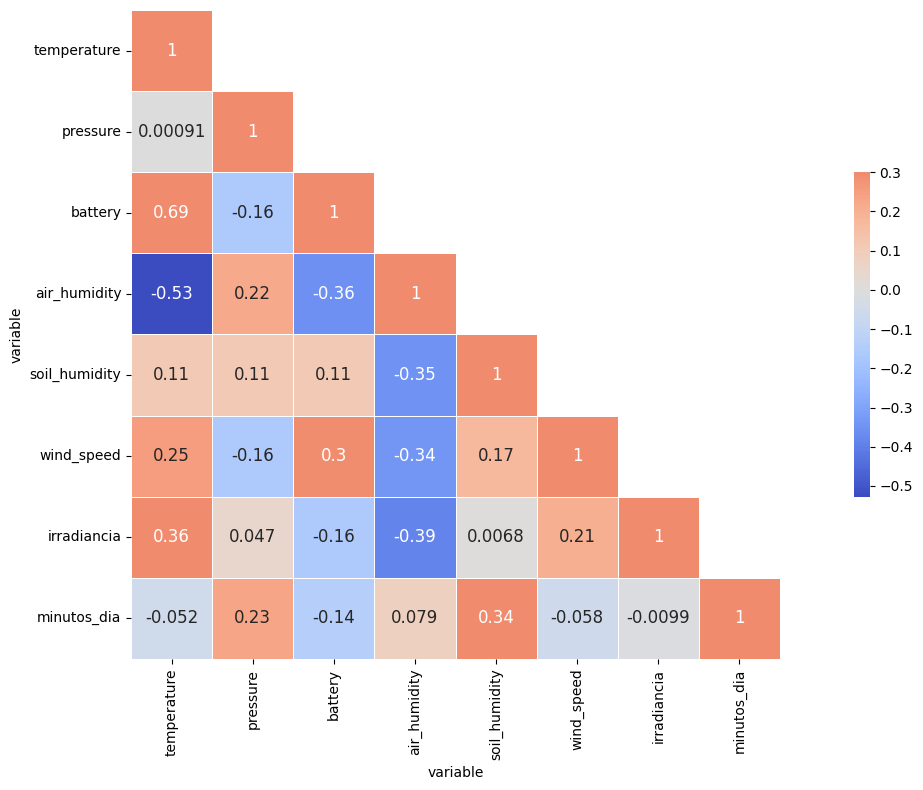

 
Información correspondiente al sensor 4e0031000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


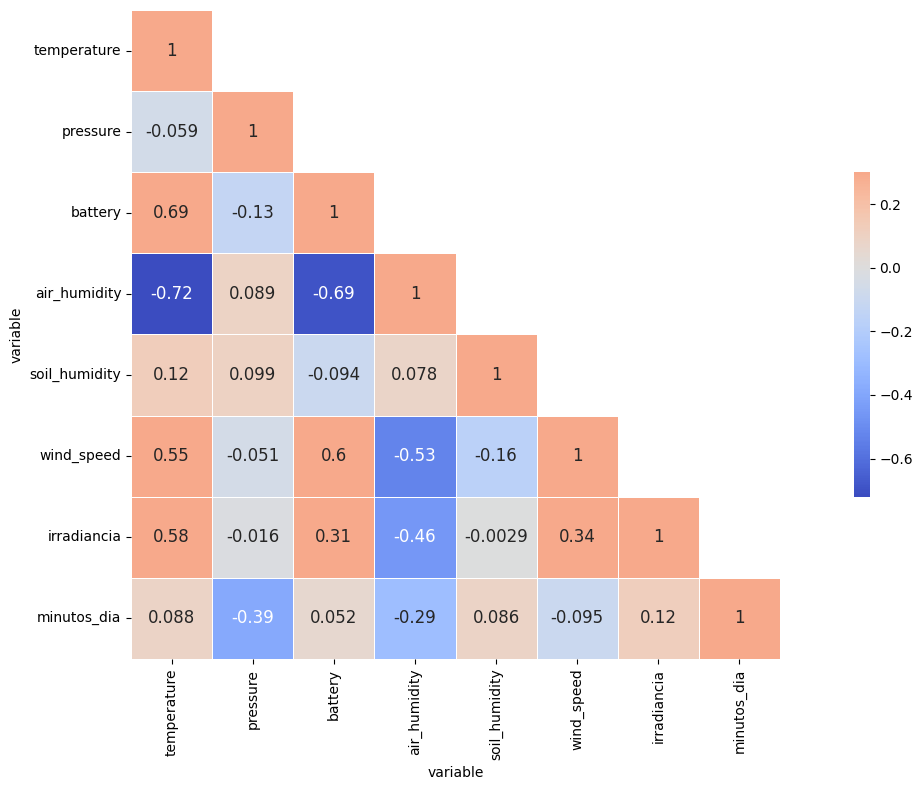

 
Información correspondiente al sensor 46004e000251353337353037:
-------------------------------------------------------------------------------------------------------------------------------------


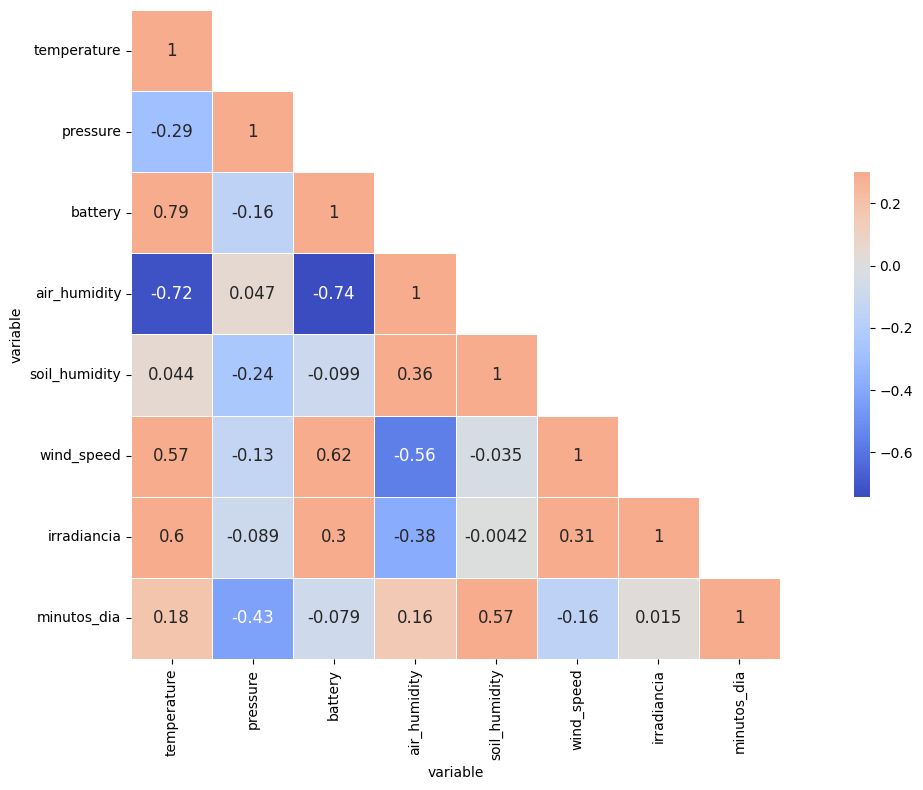

 
Información correspondiente al sensor 200034001951343334363036:
-------------------------------------------------------------------------------------------------------------------------------------


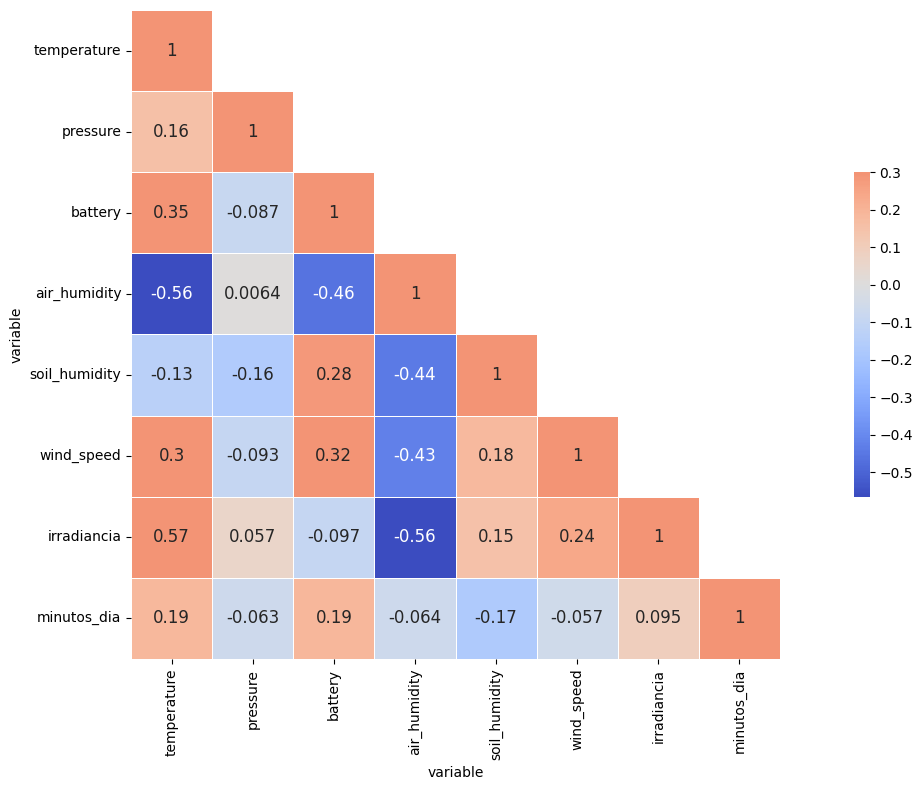

In [80]:
for sensor_id, dataset in sensors_data_clean_plus.items():
    print(" ")
    print(f"Información correspondiente al sensor {sensor_id}:")
    print("-------------------------------------------------------------------------------------------------------------------------------------")
    correlacion(dataset, f"corr{sensor_id}_2")

In [81]:
for sensor_id, df in sensors_data_clean_plus.items():
    df_to_image(df, f"../src/graficos_analisis/df_clean_{sensor_id}")

qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
qt5ct: using qt5ct plugin
qt5ct: D-Bus system tray: yes
Loading page (1/2)
Rendering (2/2)                                                    
Done         

sensor 270043001951343334363036


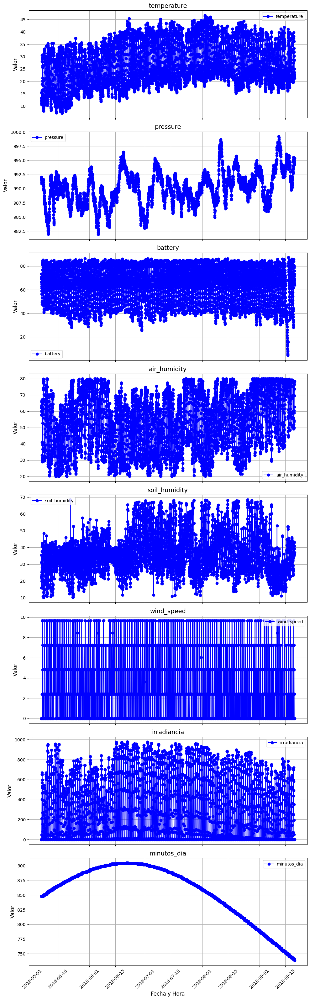

sensor 380033001951343334363036


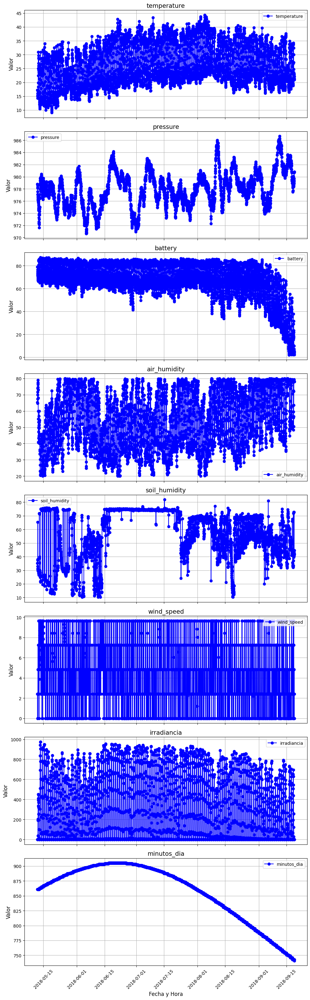

sensor 46005a000351353337353037


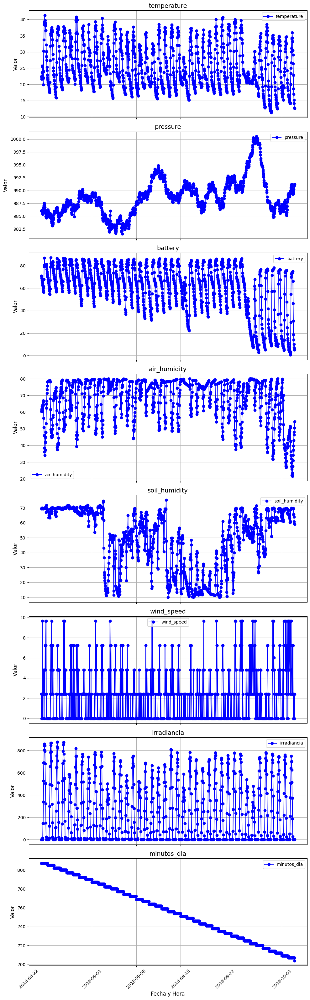

sensor 4e0022000251353337353037


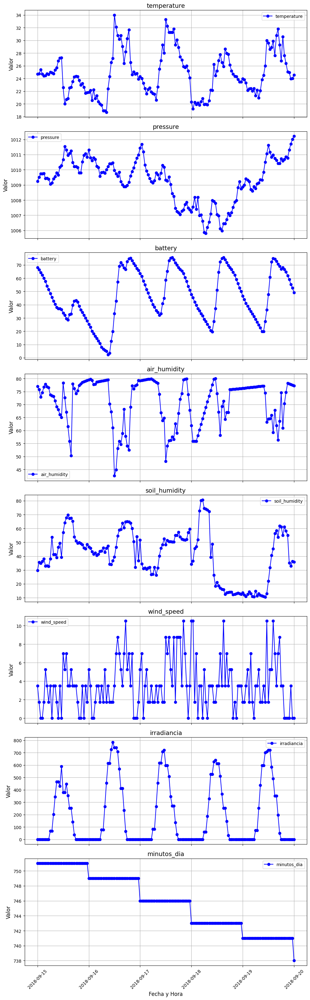

sensor 4e0031000251353337353037


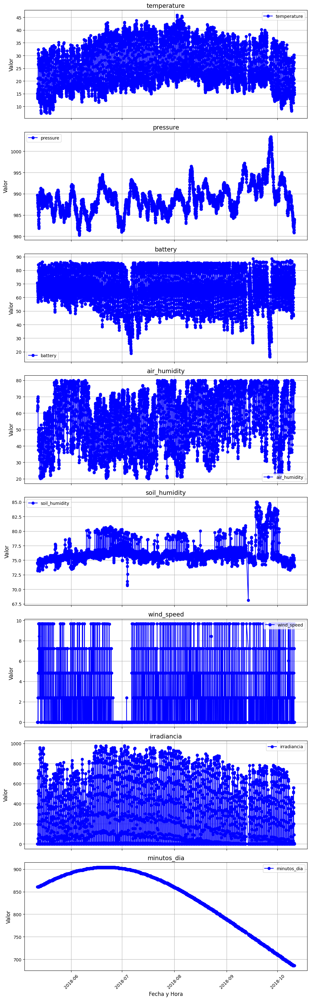

sensor 46004e000251353337353037


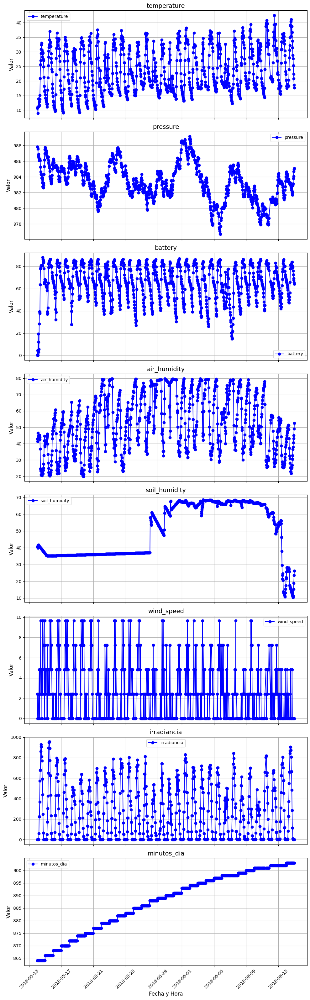

sensor 200034001951343334363036


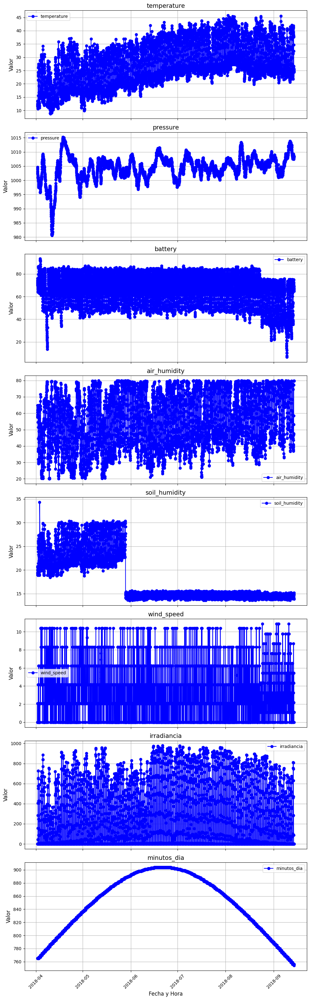

In [82]:
for sensor_id, df in sensors_data_clean_plus.items():
    print(f"sensor {sensor_id}")
    plot_variables(df)

### PCA

In [83]:
#from sklearn.decomposition import PCA
#from sklearn.manifold import TSNE
#import matplotlib.pyplot as plt

In [84]:
# Separar las variables predictoras (todas excepto la variable objetivo 'battery')
#X = df.drop(columns=["battery", "irradiancia", "minutos_dia"])  # Excluimos 'battery', 'irradiancia' y 'minutos_dia' (si no son relevantes para PCA)

In [85]:
# Estandarizar las variables predictoras con MinMaxScaler
#scaler = MinMaxScaler()
#X_scaled = scaler.fit_transform(X)

In [86]:
# Aplicar PCA
#pca = PCA()
#X_pca = pca.fit_transform(X_scaled)

In [87]:
# Mostrar la varianza explicada por cada componente principal
#explained_variance = pca.explained_variance_ratio_
#print("Varianza explicada por cada componente principal:", explained_variance)

In [88]:
# Graficar la varianza explicada acumulada
#plt.figure(figsize=(8, 6))
#plt.plot(range(1, len(explained_variance) + 1), explained_variance.cumsum(), marker='o')
#plt.xlabel('Número de componentes principales')
#plt.ylabel('Varianza explicada acumulada')
#plt.title('Varianza explicada acumulada por PCA')
#plt.grid()
#plt.show()

In [89]:
#Ver los componentes principales
#components_df = pd.DataFrame(pca.components_, columns=X.columns)
#print("\nComponentes principales:")
#print(components_df)

### TSNE

In [90]:
#Aplicar t-SNE
#tsne = TSNE(n_components=2, random_state=42)  # Reducir a 2 dimensiones
#X_tsne = tsne.fit_transform(X_scaled)

In [91]:
# 4. Visualización de los resultados t-SNE
#plt.figure(figsize=(8, 6))
#plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=df['battery'], cmap='viridis', label='Battery levels')
#plt.colorbar(label='Battery level')
#plt.xlabel('Componente 1 (t-SNE)')
#plt.ylabel('Componente 2 (t-SNE)')
#plt.title('Visualización t-SNE de las variables predictoras')
#plt.show()

In [92]:
#!pip install umap-learn

In [93]:
#import umap
# Aplicar UMAP
#umap_model = umap.UMAP(n_components=2, random_state=42)  # Reducir a 2 dimensiones
#X_umap = umap_model.fit_transform(X_scaled)

In [94]:
#Visualización de los resultados UMAP
#plt.figure(figsize=(8, 6))
#plt.scatter(X_umap[:, 0], X_umap[:, 1], c=df['battery'], cmap='viridis', label='Battery levels')
#plt.colorbar(label='Battery level')
#plt.xlabel('Componente 1 (UMAP)')
#plt.ylabel('Componente 2 (UMAP)')
#plt.title('Visualización UMAP de las variables predictoras')
#plt.show()